<h1><center>Feature selection & Model training</center></h1>

#### Author:
Wenwen Kong

#### Take-home:

- Recall that we created a feature dataframe during the EDA process. Here, we do another round of feature selection by applying several scikit-learn feature selection methods to both the raw feature df and our EDA selected df. This provides a sanity check about whether we missed some useful features from the raw df that could be used to fit our model. 

- We practice with several linear and tree-based regression models, and walk through all necessary workflows of a machine learning project, including feature selection, cross validation, baseline modeling, and hyperparameter tuning. 

- XGBRegressor performs best among all models considered in this notebook. Using an updated feature df, and RandomizedSearchCV tuned hyperparameters, we train a XGBRegressor model using 1981-2015 data, and predict the U.S. soybean annual yield in 2016. Our prediction gives an $R^{2}$ close to 0.9. See the end of the notebook for the map view of the true versus predicted values, and their difference.

#### Updated:
Nov 29, 2022

---
<a id='section_t'></a>

<h2>Table of contents</h2>

- ### 0. [Workflow](#section_0)

- ### 1. [Set up the basics](#section_1) 

    - #### 1.1 [Set up path](#section_1.1)
    
    - #### 1.2 [Set up random seeds](#section_1.2)
    
    - #### 1.3 [Load and split data](#section_1.3)
    
    - #### 1.4 [Create cv split indices](#section_1.4)

- ### 2. [Baseline modeling](#section_2)

    - #### 2.1 [Linear regression models (OLS, Ridge, Lasso)](#section_2.1)
    
    - #### 2.2 [Tree-based models (Decision Tree, Random Forests, XGBoost)](#section_2.2)
    
    - #### 2.3 [Visualize the models' performance](#section_2.3)

- ### 3. [Feature selection](#section_3)
    
    - #### 3.1 [Feature selection with `VarianceThreshold`](#section_3.1)
    
    - #### 3.2 [Feature selection with `f_regression` and `mutual_info_regression`](#section_3.2)
    
    - #### 3.3 [Feature selection with `Lasso`](#section_3.3)
    
    - #### 3.4 [Feature selection with `SelectFromModel` in tree-based models](#section_3.4)

    - #### 3.5 [Update X_train and X_test based on feature selection](#section_3.5)

- ### 4. [Hyperparameter tuning with XGBoost](#section_4)

    - #### 4.1 [RandomizedSearchCV](#section_4.1)
    
    - #### 4.2 [Bayesian Optimization (OPTUNA framework)](#section_4.2)
    
    - #### 4.3 [Save model and visualize results](#section_4.3)

# Libraries 

In [1]:
import os
import time
import pandas as pd
import numpy as np
import inspect
from math import sqrt
from IPython.display import Image

import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
cartopy.config['data_dir'] = os.getenv('CARTOPY_DIR', cartopy.config.get('data_dir'))
import geopandas as gpd
import cmocean
from mpl_toolkits.basemap import Basemap
import matplotlib

from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, KFold, learning_curve

from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_regression, mutual_info_regression, \
SelectFromModel

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

import xgboost

import pickle
import json
import optuna 
from optuna.samplers import TPESampler

In [2]:
import sklearn
sklearn.__version__

'1.0.2'

### Import customized utils

In [3]:
import utils

---
<a id='section_0'></a>

# 0. Workflow 

Back to [the table of contents](#section_t)


## <center>Machine Learning / Deep Learning workflow</center>


### We show the typical workflow for end of end machine learning / deep learning in below. The two images are from DataCamp and codecademy, respectively. 

### In our notebooks 1 & 2, we've covered the data preparation, exploratory data analysis, and feature engineering process. In the current notebook, we start with dataset splitting, and go through the model training, model evaluatiion, and hyperparameter tunning. 

![texte](https://res.cloudinary.com/dyd911kmh/image/upload/v1662709040/Marketing/Blog/Machine_Learning_Workflow.pdf)

#### <center>Source: [A Beginner's Guide to The Machine Learning Workflow](https://www.datacamp.com/blog/a-beginner-s-guide-to-the-machine-learning-workflow) from DataCamp's blog </center>

    
![texte](https://content.codecademy.com/courses/deeplearning-with-tensorflow/Workflow/Workflow.png)

#### <center>Source: [Deep Learning Workflow](https://www.codecademy.com/article/deep-learning-workflow) from Codecademy</center>

---
### Below is a machine learning cheatsheet provided by DataCamp. It lists the top machine learning algorithms, their advantages and disadvantages, and use-cases. 

### We will be using supervised regression algorithms to tackle our problem. Particularly, we will explore three linear regression models (OLS, Ridge, Lasso) and three tree-based models (Decision Tree, Random Forests, and XGBoost).

![texte](https://s3.amazonaws.com/assets.datacamp.com/email/other/ML+Cheat+Sheet_2.pdf)

#### <center>[Machine Learning cheatsheet](https://www.datacamp.com/cheat-sheet/machine-learning-cheat-sheet)</center>

---
<a id='section_1'></a>

# 1. Set up the basics

Back to [the table of contents](#section_t)

<a id='section_1.1'></a>

---
## 1.1 Set up path

In [4]:
base_dir = os.getcwd()
data_dir = os.path.join(base_dir, 'data/')
save_dir = os.path.join(base_dir, 'model/')

---
<a id='section_1.2'></a>

## 1.2 Set up random seeds

In [5]:
SEED = 0
np.random.seed(SEED)

---
<a id='section_1.3'></a>

## 1.3 Load and split data

### Load data

- `df_v0` - the dataframe that contains all raw features 

- `df_v1` - the dataframe that contains EDA engineered features 

- When reading the dataframes, we drop the first two index columns by using .iloc[:, 2:]

In [6]:
df_v0  = pd.read_csv(data_dir+'US_SoybeanYield_ClimateFeature_1981-2016_v0.csv').iloc[:, 2:]
df_v1  = pd.read_csv(data_dir+'US_SoybeanYield_ClimateFeature_1981-2016_v1.csv').iloc[:, 2:]

In [7]:
df_v0.head()

,lat,lon,year,yield,SWdown_Jan,LWdown_Jan,SWnet_Jan,LWnet_Jan,Qle_Jan,Qh_Jan,...,ACond_Oct,CCond_Oct,RCS_Oct,RCT_Oct,RCQ_Oct,RCSOL_Oct,RSmin_Oct,RSMacr_Oct,LAI_Oct,GVEG_Oct
0,25.25,252.25,1981,1.222455,159.92084,346.99466,130.236630,-58.938140,49.757866,24.595564,...,0.019248,0.005558,0.302989,0.984030,0.838222,0.598284,70.00,0.266098,3.073271,0.630000
1,25.25,261.75,1981,0.730697,123.25622,340.83930,90.953440,-47.860847,30.156218,15.754601,...,0.030544,0.004366,0.324755,0.968040,0.820579,0.558200,70.00,0.156077,2.634722,0.257372
2,25.75,251.75,1981,0.720959,158.17145,344.05258,129.672600,-61.418865,50.223950,21.417778,...,0.018551,0.006257,0.304062,0.983345,0.829444,0.688191,70.00,0.261147,3.015503,0.589569
3,25.75,252.25,1981,1.450878,157.28096,329.23950,131.438960,-59.363853,51.495888,23.997215,...,0.018673,0.007791,0.263362,0.973431,0.866197,0.593243,70.00,0.342257,4.746787,0.781945
4,25.75,261.25,1981,1.049755,121.04869,334.77954,86.365326,-48.992542,26.840885,13.713440,...,0.020603,0.003628,0.301001,0.957830,0.820281,0.626837,138.75,0.189734,2.873339,0.257932


In [8]:
df_v1.head()

,lat,lon,year,yield,JJA_SWdown,JJA_LWnet,JFMA_EF,JJA_EF,SO_EF,JFMA_Rainf,MJJ_Rainf,JF_Snowf,JJA_ESoil,MJJA_Albedo,MJJA_SoilM_0_10cm,JFMA_RootMoist,JanToApr_LAI,MayToOct_ACond,Lead_AnnualTotal_Rainf
0,25.25,252.25,1981,1.222455,252.770920,-48.225912,0.285506,0.441266,0.586137,46.581851,81.153172,0.0,22.073736,26.032770,19.652716,357.757040,2.573128,0.024078,849.102356
1,25.25,261.75,1981,0.730697,270.749867,-49.791474,0.300171,0.408907,0.388078,46.178984,105.788620,0.0,42.058517,35.703616,26.392085,502.478325,2.477914,0.030089,478.890076
2,25.75,251.75,1981,0.720959,261.569297,-49.627482,0.263053,0.452311,0.589255,36.861862,95.028409,0.0,24.154114,25.062099,18.610214,375.291322,2.581406,0.023941,780.922180
3,25.75,252.25,1981,1.450878,249.793410,-51.367977,0.272385,0.497514,0.642816,42.882309,100.522940,0.0,19.862432,22.567089,24.667119,405.738083,3.612560,0.023328,861.817261
4,25.75,261.25,1981,1.049755,273.741840,-54.618190,0.308435,0.399829,0.386794,53.773328,105.505384,0.0,43.704834,38.378573,27.998140,345.085285,2.493556,0.021317,457.677155


---
### Sanity check before you use supervised learning 
- No missing values
- Data in numeric format
- Data stored in pandas DataFrame or NumPy array 

In [9]:
df_v0.isna().sum().sort_values()

lat             0
CanopInt_Jul    0
SubSnow_Jul     0
ESoil_Jul       0
TVeg_Jul        0
               ..
Qf_Apr          0
Qg_Apr          0
Qh_Apr          0
LWnet_Apr       0
GVEG_Oct        0
Length: 524, dtype: int64

In [10]:
df_v1.isna().sum().sort_values()

lat                       0
JanToApr_LAI              0
JFMA_RootMoist            0
MJJA_SoilM_0_10cm         0
MJJA_Albedo               0
JJA_ESoil                 0
JF_Snowf                  0
MJJ_Rainf                 0
MayToOct_ACond            0
JFMA_Rainf                0
JJA_EF                    0
JFMA_EF                   0
JJA_LWnet                 0
JJA_SWdown                0
yield                     0
year                      0
lon                       0
SO_EF                     0
Lead_AnnualTotal_Rainf    0
dtype: int64

---

### Split to X_train, X_test, y_train, y_test

<div class="alert alert-block alert-info">

### Note:
    
- #### We use 1981-2015 as the traininig set, and we hold out 2016 as the test set. 

- #### The cross-validaiton later on will also be solely based on the training set, so the model never get a chance to peek our test set until we have finished our hyperparameter tuning and are ready to test our model's performance on the test set. 

- #### We cannot directly use scikit-learn's `train_test_split` method because the time information is important here. 
    
</div>

Back to [the table of contents](#section_t)

In [11]:
# ****************************
# split df_v0
# ****************************
v0_X_train_df = df_v0[df_v0['year'] <= 2015].drop(['yield'], axis=1)
v0_y_train_df = df_v0[df_v0['year'] <= 2015]['yield']
v0_X_test_df  = df_v0[df_v0['year'] == 2016].drop(['yield'], axis=1)
v0_y_test_df  = df_v0[df_v0['year'] == 2016]['yield']

v0_X_train = v0_X_train_df.values
v0_y_train = v0_y_train_df.values
v0_X_test  = v0_X_test_df.values
v0_y_test  = v0_y_test_df.values

print(v0_X_train.shape, v0_y_train.shape, v0_X_test.shape, v0_y_test.shape)

(51965, 523) (51965,) (1419, 523) (1419,)


In [12]:
# ****************************
# split df_v1
# ****************************
v1_X_train_df = df_v1[df_v1['year'] <= 2015].drop(['yield'], axis=1)
v1_y_train_df = df_v1[df_v1['year'] <= 2015]['yield']
v1_X_test_df  = df_v1[df_v1['year'] == 2016].drop(['yield'], axis=1)
v1_y_test_df  = df_v1[df_v1['year'] == 2016]['yield']

v1_X_train = v1_X_train_df.values
v1_y_train = v1_y_train_df.values
v1_X_test  = v1_X_test_df.values
v1_y_test  = v1_y_test_df.values

print(v1_X_train.shape, v1_y_train.shape, v1_X_test.shape, v1_y_test.shape)

(51965, 18) (51965,) (1419, 18) (1419,)


In [13]:
# ****************************
# scaling 
# ****************************
scaler = StandardScaler()
v0_X_train_scaled = scaler.fit_transform(v0_X_train)
v0_X_test_scaled  = scaler.transform(v0_X_test)
v1_X_train_scaled = scaler.fit_transform(v1_X_train)
v1_X_test_scaled  = scaler.transform(v1_X_test)

---
<a id='section_1.4'></a>

## 1.4 Create cv split indices

### Expanding window cross-validation (also called walk forward cv)
 
 - Recall our goal of this project: train a model based on the historical relationship between soybean annual yield and local monthly or aggregated climate variables, and test the predictive power of the trained model on the most recent year's annual yield. Therefore, there is a temporal component in this problem, and **we do not want to simply use the `train_test_split` provided by scikit-learn for cross-validation**, because that method does not care about the temporal order.
 
 - Quotes from [Machine Learning Mastery: How To Backtest Machine Learning Models for Time Series Forecasting](https://machinelearningmastery.com/backtest-machine-learning-models-time-series-forecasting/)
  
  > The fast and powerful methods that we rely on in machine learning, such as using train-test splits and k-fold cross validation, do not work in the case of time series data. This is because they ignore the temporal components inherent in the problem.
  
 - We will be using an **expanding window cross validation approach** (figure from [Uber blog](https://www.uber.com/blog/omphalos/)):
 
![texte](http://eng.uber.com/wp-content/uploads/2018/01/image6-2-1024x542.png) 
 
 - Our training set spans from 1980 to 2015. We will do five splits in our training set, as follows. Note that the test size is the same for each split, which is important because we want to makes sure the performance statistics for each split are comparable. Having the same sample size of the test set provides an apple-to-apple comparison. 
 
     - Split 1: 1980-2010 train, 2011 test

     - Split 2: 1980-2011 train, 2012 test

     - Split 3: 1980-2012 train, 2013 test

     - Split 4: 1980-2013 train, 2014 test

     - Split 5: 1980-2014 train, 2015 test

### Customized cv split indices

 - Since we cannot directly use KFold for cv, we should come up with our own cv split indices. 
 
 - There is a paramter `cv` in [cross_val_score](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html), [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html), and [RandomizedSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html). The parameter description says `cv` can be `an iterable yielding (train, test) splits as arrays of indices.`
 
Back to [the table of contents](#section_t)

### Sanity check the test size for the cross validation is the same

In [14]:
print(df_v1[df_v1['year'] == 2011].shape)
print(df_v1[df_v1['year'] == 2012].shape)
print(df_v1[df_v1['year'] == 2013].shape)
print(df_v1[df_v1['year'] == 2014].shape)
print(df_v1[df_v1['year'] == 2015].shape)

(1419, 19)
(1419, 19)
(1419, 19)
(1419, 19)
(1419, 19)


### Create `cv_split_indices`

In [15]:
split1_train_indices = df_v1.index[df_v1['year'] < 2011].values
split1_test_indices  = df_v1.index[df_v1['year'] ==2011].values

split2_train_indices = df_v1.index[df_v1['year'] < 2012].values
split2_test_indices  = df_v1.index[df_v1['year'] ==2012].values

split3_train_indices = df_v1.index[df_v1['year'] < 2013].values
split3_test_indices  = df_v1.index[df_v1['year'] ==2013].values

split4_train_indices = df_v1.index[df_v1['year'] < 2014].values
split4_test_indices  = df_v1.index[df_v1['year'] ==2014].values

split5_train_indices = df_v1.index[df_v1['year'] < 2015].values
split5_test_indices  = df_v1.index[df_v1['year'] ==2015].values

cv_split_indices     = [(split1_train_indices, split1_test_indices),\
                        (split2_train_indices, split2_test_indices), \
                        (split3_train_indices, split3_test_indices), \
                        (split4_train_indices, split4_test_indices), \
                        (split5_train_indices, split5_test_indices)]

cv_split_indices

[(array([    0,     1,     2, ..., 44867, 44868, 44869]),
  array([44870, 44871, 44872, ..., 46286, 46287, 46288])),
 (array([    0,     1,     2, ..., 46286, 46287, 46288]),
  array([46289, 46290, 46291, ..., 47705, 47706, 47707])),
 (array([    0,     1,     2, ..., 47705, 47706, 47707]),
  array([47708, 47709, 47710, ..., 49124, 49125, 49126])),
 (array([    0,     1,     2, ..., 49124, 49125, 49126]),
  array([49127, 49128, 49129, ..., 50543, 50544, 50545])),
 (array([    0,     1,     2, ..., 50543, 50544, 50545]),
  array([50546, 50547, 50548, ..., 51962, 51963, 51964]))]

---
<a id='section_2'></a>

# 2. Baseline modeling

We first run a few baseline models to get a sense of how each model performs with df_v0 and df_v1 with their default parameters. We use three linear models (OLS, Ridge, Lasso) and three tree-based models (Decision Tree, Random Forests, XGBoost).

### Summary: 
    
   -  Across all three linear regression models, OLS and Ridge perform equally well, while Lasso performs the worst. These differences are evidenced by a decrease of R-squared of the test set from OLS, Ridge to Lasso, and an increase of RMSE of the test set from OLS, Ridge to Lasso. 
    
        - Note that we would expect Ridge performs better than OLS, which may become clearer when we do cross validation later. 
    
        - Despite a worse performance among all linear models, Lasso predicted R-squared is not bad (close to 0.6). 
    
        - Though it's a baseline modeling, I did specify the alpha parameter for Lasso. Because I got negative R-squared if I use the default alpha (1.0). That's likely because an alpha = 1.0 shrinks the features too much, resulting a model that's oversimple. The consequence is that our RSS is larger then TSS, e.g., our prediction cannnot even beat the prediction simply using the mean of the target values. 
    
   - Tree-based models evidently perform better than the linear models. The performance from tree-based models ranks from low to high: Decision Tree -> Random Forests -> XGBoost. 
    
   - Using more features (e.g., the raw feature set v0) give slightly better results than using our selected features (e.g., v1) based on EDA and domain knowledge. However, the difference is very subtle. Interestingly, both RF and XGBoost actually make a better prediction with v1 compared to v0. 


Back to [the table of contents](#section_t)

---
<a id='section_2.1'></a>

## 2.1 Linear regression models (OLS, Ridge, Lasso)

- ### Fit linear model on df_v0 and print out $R^{2}$ and RMSE

OLS df_v0: test set R-squared: 0.7626944794929662
OLS df_v0: test Set RMSE: 0.5349000960421639
Ridge df_v0: test set R-squared: 0.7695493228182138
Ridge df_v0: test Set RMSE: 0.5271178819428477
Lasso(0.1) df_v0: test set R-squared: 0.5704932943413499
Lasso(0.1) df_v0: test Set RMSE: 0.719620835972353


(array([0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 ]),
 <a list of 7 Text yticklabel objects>)

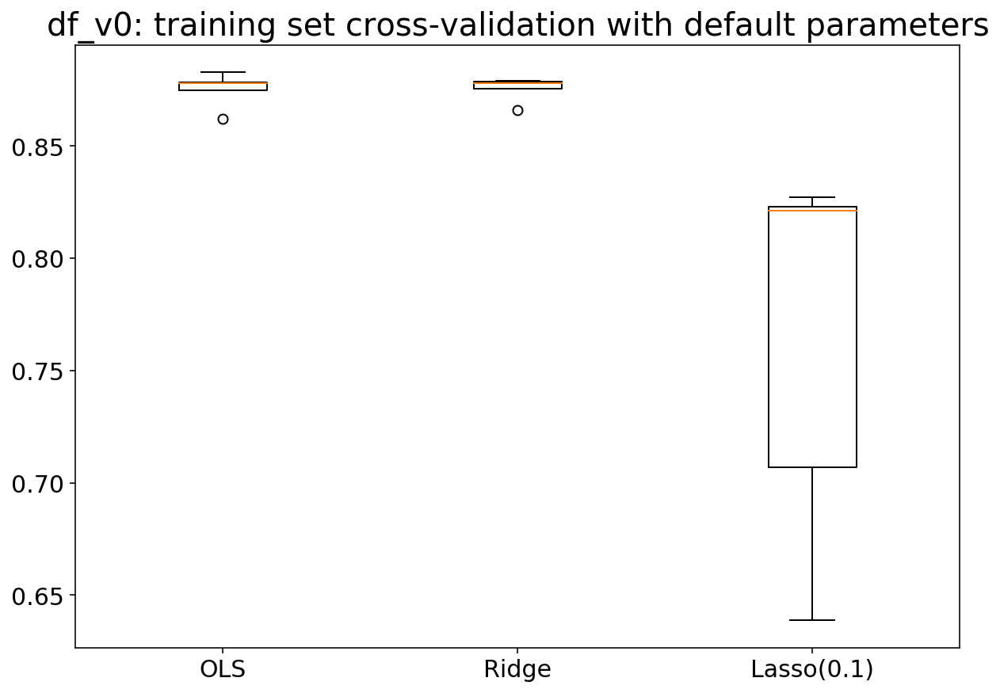

In [16]:
linear_models = {"OLS": LinearRegression(), \
                 "Ridge": Ridge(random_state=SEED), \
                 "Lasso(0.1)": Lasso(alpha=0.1, random_state=SEED)}

v0_linear_models_cv   = []
v0_linear_models_R2   = []
v0_linear_models_RMSE = []

for name, model in linear_models.items():
    
    # cross validation
    cv_score = cross_val_score(model, v0_X_train_scaled, v0_y_train, cv=cv_split_indices)
    v0_linear_models_cv.append(cv_score)
    
    # Fit and predict 
    linear_steps    = [('scaler', StandardScaler()), \
                       (name, model)]
    
    linear_pipeline = Pipeline(linear_steps)
    
    linear_pipeline.fit(v0_X_train, v0_y_train)
    
    v0_y_pred       = linear_pipeline.predict(v0_X_test)
    
    linear_score_R2 = linear_pipeline.score(v0_X_test, v0_y_test)
    
    linear_score_RMSE = mean_squared_error(v0_y_test, v0_y_pred, squared=False)
    
    v0_linear_models_R2.append(linear_score_R2)
    v0_linear_models_RMSE.append(linear_score_RMSE)

    print("{} df_v0: test set R-squared: {}".format(name, linear_score_R2))
    print("{} df_v0: test Set RMSE: {}".format(name, linear_score_RMSE))

fig,ax = plt.subplots(figsize =(10, 7))
ax.boxplot(v0_linear_models_cv, labels = linear_models.keys())
ax.set_title('df_v0: training set cross-validation with default parameters', fontsize= 20)
ax.set_xticklabels(linear_models.keys(), fontsize= 15)
plt.yticks(fontsize=15)

- ### Fit linear model on df_v1 and print out $R^{2}$ and RMSE

OLS df_v1: test set R-squared: 0.7465195258213597
OLS df_v1: test Set RMSE: 0.5528292464910133
Ridge df_v1: test set R-squared: 0.7465077826768338
Ridge df_v1: test Set RMSE: 0.5528420519715407
Lasso(0.1) df_v1: test set R-squared: 0.5520789215973747
Lasso(0.1) df_v1: test Set RMSE: 0.7348852068773734


(array([0.5 , 0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85]),
 <a list of 8 Text yticklabel objects>)

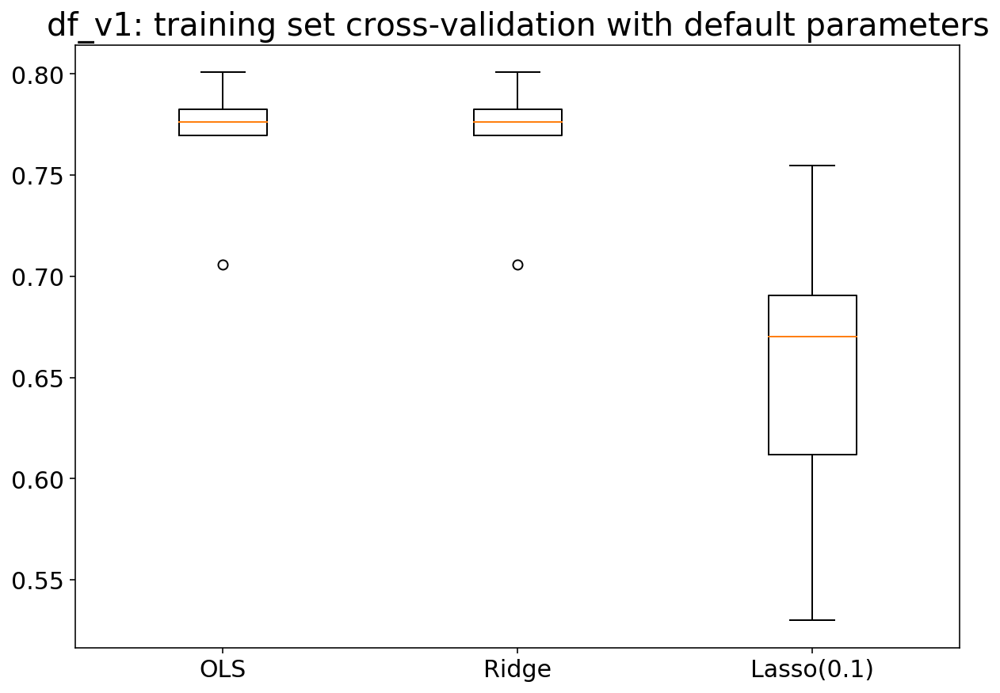

In [17]:
v1_linear_models_cv   = []
v1_linear_models_R2   = []
v1_linear_models_RMSE = []

for name, model in linear_models.items():
    
    # cross validation
    cv_score = cross_val_score(model, v1_X_train_scaled, v1_y_train, cv=cv_split_indices)
    v1_linear_models_cv.append(cv_score)
    
    # Fit and predict
    linear_steps    = [('scaler', StandardScaler()), \
                       (name, model)]
    
    linear_pipeline = Pipeline(linear_steps)
    
    linear_pipeline.fit(v1_X_train, v1_y_train)
    
    v1_y_pred       = linear_pipeline.predict(v1_X_test)
    
    linear_score_R2 = linear_pipeline.score(v1_X_test, v1_y_test)
    
    linear_score_RMSE = mean_squared_error(v1_y_test, v1_y_pred, squared=False)
    
    v1_linear_models_R2.append(linear_score_R2)
    v1_linear_models_RMSE.append(linear_score_RMSE)

    print("{} df_v1: test set R-squared: {}".format(name, linear_score_R2))
    print("{} df_v1: test Set RMSE: {}".format(name, linear_score_RMSE))
    
fig,ax = plt.subplots(figsize =(10, 7))
ax.boxplot(v1_linear_models_cv, labels = linear_models.keys())
ax.set_title('df_v1: training set cross-validation with default parameters', fontsize= 20)
ax.set_xticklabels(linear_models.keys(), fontsize= 15)
plt.yticks(fontsize=15)

---
<a id='section_2.2'></a>

## 2.2 Tree-based models (Decision Tree, Random Forests, XGBoost)

Back to [the table of contents](#section_t)

- ### Fit tree models on df_v0 and print out $R^{2}$ and RMSE
    - The cross-validation of randomforest model on the raw df is too slow, so we skip that part.

In [19]:
tree_models = {"DecisionTree": DecisionTreeRegressor(random_state=SEED), \
               "RandomForests": RandomForestRegressor(random_state=SEED), \
               "XGBoost": xgboost.XGBRegressor(random_state=SEED)}

v0_tree_models_R2     = []
v0_tree_models_RMSE   = []

for name, model in tree_models.items():
    
    # Fit and predict
    tree_steps    = [('scaler', StandardScaler()), \
                       (name, model)]
    
    tree_pipeline = Pipeline(tree_steps)
    
    tree_pipeline.fit(v0_X_train, v0_y_train)
    
    v0_y_pred       = tree_pipeline.predict(v0_X_test)
    
    tree_R2         = tree_pipeline.score(v0_X_test, v0_y_test)

    tree_RMSE       = mean_squared_error(v0_y_test, v0_y_pred, squared=False)
    
    v0_tree_models_R2.append(tree_R2)
    v0_tree_models_RMSE.append(tree_RMSE)

    print("{} df_v0: test set R-squared: {}".format(name, tree_R2))
    print("{} df_v0: test Set RMSE: {}".format(name, tree_RMSE))


DecisionTree df_v0: test set R-squared: 0.8078799790073526
DecisionTree df_v0: test Set RMSE: 0.4812880380682958
RandomForests df_v0: test set R-squared: 0.8703543918567448
RandomForests df_v0: test Set RMSE: 0.39536448961336423
XGBoost df_v0: test set R-squared: 0.9046311523041123
XGBoost df_v0: test Set RMSE: 0.3390954971161544


- ### Fit tree models on df_v1 and print out $R^{2}$ and RMSE

DecisionTree df_v1: test set R-squared: 0.8090103166827431
DecisionTree df_v1: test Set RMSE: 0.47987012091395026
RandomForests df_v1: test set R-squared: 0.8809268833674404
RandomForests df_v1: test Set RMSE: 0.3789008815194211
XGBoost df_v1: test set R-squared: 0.9041557370353888
XGBoost df_v1: test Set RMSE: 0.33993964470679844


(array([0.8 , 0.82, 0.84, 0.86, 0.88, 0.9 , 0.92, 0.94, 0.96]),
 <a list of 9 Text yticklabel objects>)

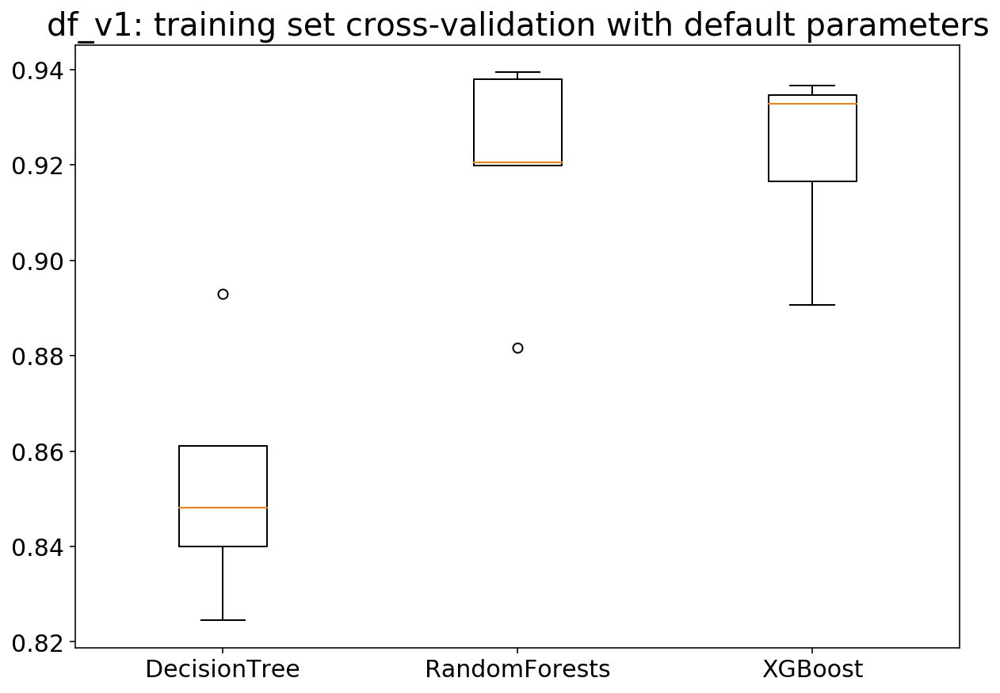

In [20]:
v1_tree_models_cv     = []
v1_tree_models_R2     = []
v1_tree_models_RMSE   = []

for name, model in tree_models.items():
    
    # Cross-validation
    cv_score = cross_val_score(model, v1_X_train_scaled, v1_y_train, cv=cv_split_indices)
    v1_tree_models_cv.append(cv_score)
    
    # Fit and predict
    tree_steps    = [('scaler', StandardScaler()), \
                       (name, model)]
    
    tree_pipeline = Pipeline(tree_steps)
    
    tree_pipeline.fit(v1_X_train, v1_y_train)
    
    v1_y_pred       = tree_pipeline.predict(v1_X_test)
    
    tree_R2         = tree_pipeline.score(v1_X_test, v1_y_test)

    tree_RMSE       = mean_squared_error(v1_y_test, v1_y_pred, squared=False)
    
    v1_tree_models_R2.append(tree_R2)
    v1_tree_models_RMSE.append(tree_RMSE)

    print("{} df_v1: test set R-squared: {}".format(name, tree_R2))
    print("{} df_v1: test Set RMSE: {}".format(name, tree_RMSE))
    
fig,ax = plt.subplots(figsize =(10, 7))
ax.boxplot(v1_tree_models_cv, labels = tree_models.keys())
ax.set_title('df_v1: training set cross-validation with default parameters', fontsize= 20)
ax.set_xticklabels(tree_models.keys(), fontsize= 15)
plt.yticks(fontsize=15)

### Create a dataframe to archive the above model results 

In [21]:
baseline_model_scores = pd.DataFrame({"v0_linear_models_R2": v0_linear_models_R2, \
                                      "v0_linear_models_RMSE": v0_linear_models_RMSE, \
                                      "v1_linear_models_R2": v1_linear_models_R2, \
                                      "v1_linear_models_RMSE": v1_linear_models_RMSE, \
                                      "v0_tree_models_R2": v0_tree_models_R2, \
                                      "v0_tree_models_RMSE": v0_tree_models_RMSE, \
                                      "v1_tree_models_R2": v1_tree_models_R2, \
                                      "v1_tree_models_RMSE": v1_tree_models_RMSE})

baseline_model_scores

,v0_linear_models_R2,v0_linear_models_RMSE,v1_linear_models_R2,v1_linear_models_RMSE,v0_tree_models_R2,v0_tree_models_RMSE,v1_tree_models_R2,v1_tree_models_RMSE
0,0.762694,0.534900,0.746520,0.552829,0.807880,0.481288,0.809010,0.479870
1,0.769549,0.527118,0.746508,0.552842,0.870354,0.395364,0.880927,0.378901
2,0.570493,0.719621,0.552079,0.734885,0.904631,0.339095,0.904156,0.339940


---
<a id='section_2.3'></a>

## 2.3 Visualize the models' performance 

Back to [the table of contents](#section_t)

- ### Visualize the $R^{2}$ from each model and dataset

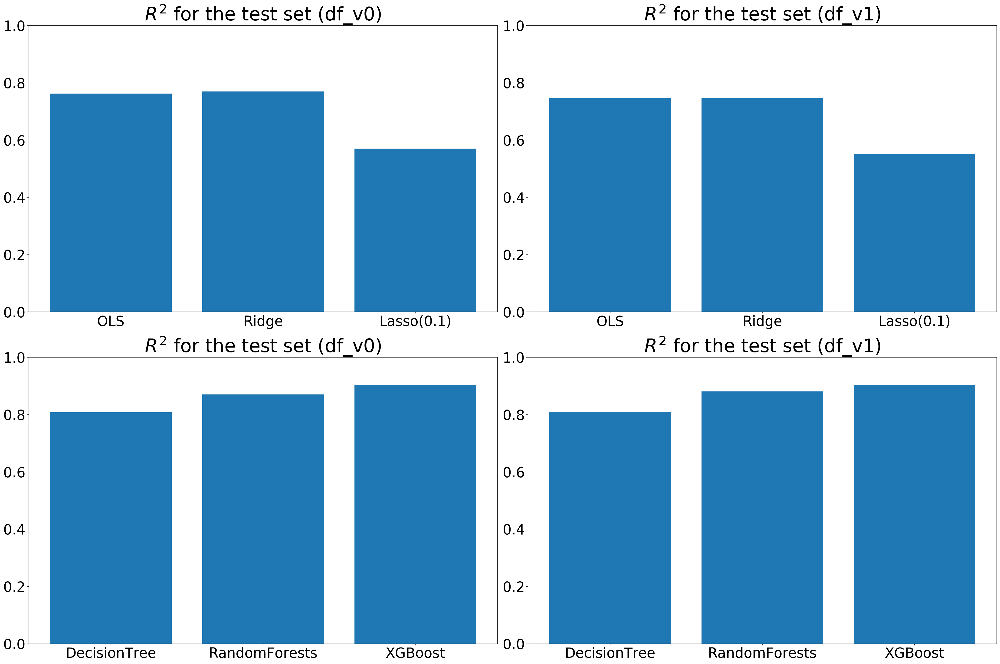

In [22]:
fig, ax = plt.subplots(2, 2, figsize= (30, 20))
#plt.rcParams['axes.labelsize'] = 30
ax[0,0].bar(np.array(list(linear_models.keys())), v0_linear_models_R2)
ax[0,0].set_title(r'$R^{2}$'+ ' for the test set (df_v0)',fontsize=40)

ax[0,1].bar(np.array(list(linear_models.keys())), v1_linear_models_R2)
ax[0,1].set_title(r'$R^{2}$'+' for the test set (df_v1)', fontsize=40)

ax[1,0].bar(np.array(list(tree_models.keys())), v0_tree_models_R2)
ax[1,0].set_title(r'$R^{2}$'+ ' for the test set (df_v0)',fontsize=40)

ax[1,1].bar(np.array(list(tree_models.keys())), v1_tree_models_R2)
ax[1,1].set_title(r'$R^{2}$'+' for the test set (df_v1)', fontsize=40)

ax[0,0].set_ylim(0,1)
ax[0,1].set_ylim(0,1)
ax[1,0].set_ylim(0,1)
ax[1,1].set_ylim(0,1)

ax[0,0].tick_params(axis='both', which='major', labelsize=30)
ax[0,1].tick_params(axis='both', which='major', labelsize=30)
ax[1,0].tick_params(axis='both', which='major', labelsize=30)
ax[1,1].tick_params(axis='both', which='major', labelsize=30)

fig.tight_layout()

- ### Visualize the RMSE from each model and dataset

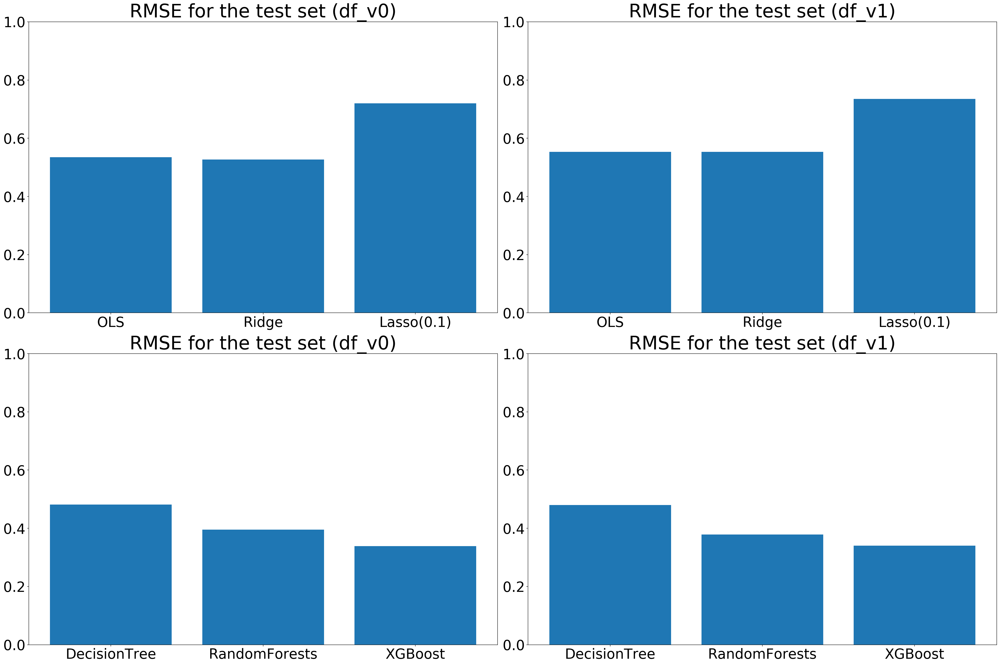

In [23]:
fig, ax = plt.subplots(2, 2, figsize= (30, 20))
#plt.rcParams['axes.labelsize'] = 30
ax[0,0].bar(np.array(list(linear_models.keys())), v0_linear_models_RMSE)
ax[0,0].set_title('RMSE for the test set (df_v0)',fontsize=40)

ax[0,1].bar(np.array(list(linear_models.keys())), v1_linear_models_RMSE)
ax[0,1].set_title('RMSE for the test set (df_v1)', fontsize=40)

ax[1,0].bar(np.array(list(tree_models.keys())), v0_tree_models_RMSE)
ax[1,0].set_title('RMSE for the test set (df_v0)',fontsize=40)

ax[1,1].bar(np.array(list(tree_models.keys())), v1_tree_models_RMSE)
ax[1,1].set_title('RMSE for the test set (df_v1)', fontsize=40)

ax[0,0].set_ylim(0,1)
ax[0,1].set_ylim(0,1)
ax[1,0].set_ylim(0,1)
ax[1,1].set_ylim(0,1)

ax[0,0].tick_params(axis='both', which='major', labelsize=30)
ax[0,1].tick_params(axis='both', which='major', labelsize=30)
ax[1,0].tick_params(axis='both', which='major', labelsize=30)
ax[1,1].tick_params(axis='both', which='major', labelsize=30)

fig.tight_layout()

---
<a id='section_3'></a>

# 3. Feature selection 

   - #### 3.1 [Feature selection with `VarianceThreshold`](#section_3.1)
    
   - #### 3.2 [Feature selection with `f_regression` and `mutual_info_regression`](#section_3.2)
    
   - #### 3.3 [Feature selection with `Lasso`](#section_3.3)
    
   - #### 3.4 [Feature selection with `SelectFromModel` in tree-based models](#section_3.4)

   - #### 3.5 [Update X_train and X_test based on feature selection](#section_3.5)
   
We usually do not have to go through so many feature selection steps. Here I tried several methods for the sake of practice. See [scikit-learn 1.13 Feature Selection](https://scikit-learn.org/stable/modules/feature_selection.html#univariate-feature-selection) for more details. 

Before we get started with each feature selection step, we first create copies of `v0_X_train_df`, `v0_X_test_df`, `v1_X_train_df`, and `v1_X_test_df`, so that we can keep those initial dataframes intact. We name the copies as `fs_v0_X_train_df`, `fs_v0_X_test_df`, `fs_v1_X_train_df`, and `fs_v1_X_test_df`.

Note that feature selection can only be done with training dataset, because we do not want our feature and model of choice to be biased/affected by the test set in any possible way. 

We will gradually update `fs_v0_X_train_df` and `fs_v1_X_train_df` as we go through the feature selection steps. `fs_v0_X_test_df` and `fs_v1_X_test_df` will be updated accordingly, in order to make sure the feature columns match between the training and test set. 

At the end of this section, we create updated X_train and X_test dataframes that will be used to model performance cross-validation and hyperparameter optimization. 

<div class="alert alert-block alert-danger">

#### Caveat:
   
 - Keep in mind that feature selection does not always guarantee improvements of your prediction
    
 - Feature selection using the linear models and the tree-based models may give you conflicting results, suggest to make a final call based on your domain knowledge and your understanding of the problem. 
    
</div>

Back to [the table of contents](#section_t)

---
## Create copies of v0_X_train_df, v0_X_test_df, v1_X_train_df, v1_X_test_df

In [24]:
fs_v0_X_train_df = v0_X_train_df.copy(deep=True)
fs_v0_X_test_df  = v0_X_test_df.copy(deep=True)
fs_v1_X_train_df = v1_X_train_df.copy(deep=True)
fs_v1_X_test_df  = v1_X_test_df.copy(deep=True)

---
<a id='section_3.1'></a>

## 3.1 Feature selection with `VarianceThreshold`

Features that have low variability likely do not provide useful information for our prediction. We can remove those features by using the `VarianceThreshold` method. Note that though, the chosen cutoff threshold is subjective. The default threshold is zero, that is, removing features that have constant values. We do not have constant features in our case (I tested this but not shown in this notebook). 

Here, I am using a very small threshold 0.00001 to identify low variance features.

Back to [the table of contents](#section_t)

#### `Function: variance_threshold_selector`

In [25]:
print(inspect.getdoc(utils.variance_threshold_selector))

parameters
----------
df: dataframe
    dataframe that contains the feature information
    in our case, df will be either v0_X_train_df or v1_X_train_df

threshold: float
    threshold used to eliminate low variance variables

returns
----------
two dataframes:
dataframe with high variance, and dataframe with low variance


In [26]:
v0_X_train_high_variance, v0_X_train_low_variance = utils.variance_threshold_selector(fs_v0_X_train_df, 0.00001)

---
### Eliminate low variance features from v0

- #### 30 features from the raw feature dataframe will be discarded due to low variability:

In [27]:
v0_X_train_low_variance

,CCond_Jan,CCond_Feb,CCond_Mar,CCond_Apr,SnowDepth_May,SnowFrac_May,CCond_May,Qf_Jun,SWE_Jun,SnowDepth_Jun,...,SnowDepth_Aug,SnowFrac_Aug,SubSnow_Aug,CCond_Aug,SWE_Sep,SnowDepth_Sep,SnowFrac_Sep,CCond_Sep,SnowDepth_Oct,CCond_Oct
0,2.938387e-03,0.002462,2.699749e-03,0.001559,0.000000,0.000000,0.001430,0.0,0.0,0.0,...,0.0,0.0,0.0,0.004906,0.0,0.0,0.0,0.005479,0.000000,0.005558
1,2.642341e-03,0.003290,3.287331e-03,0.004178,0.000000,0.000000,0.004714,0.0,0.0,0.0,...,0.0,0.0,0.0,0.003385,0.0,0.0,0.0,0.004194,0.000000,0.004366
2,3.776094e-03,0.003201,2.987696e-03,0.001669,0.000000,0.000000,0.001485,0.0,0.0,0.0,...,0.0,0.0,0.0,0.006213,0.0,0.0,0.0,0.007171,0.000000,0.006257
3,3.030103e-03,0.002373,2.636969e-03,0.001672,0.000000,0.000000,0.001529,0.0,0.0,0.0,...,0.0,0.0,0.0,0.006859,0.0,0.0,0.0,0.008056,0.000000,0.007791
4,1.516440e-03,0.002283,3.030423e-03,0.003621,0.000000,0.000000,0.004568,0.0,0.0,0.0,...,0.0,0.0,0.0,0.002362,0.0,0.0,0.0,0.003303,0.000000,0.003628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51960,3.440860e-10,0.000000,1.271397e-07,0.000005,0.000038,0.000168,0.000405,0.0,0.0,0.0,...,0.0,0.0,0.0,0.004028,0.0,0.0,0.0,0.003362,0.000001,0.001555
51961,0.000000e+00,0.000000,0.000000e+00,0.000018,0.000008,0.000000,0.000478,0.0,0.0,0.0,...,0.0,0.0,0.0,0.004742,0.0,0.0,0.0,0.003755,0.000329,0.001078
51962,0.000000e+00,0.000000,2.580645e-10,0.000021,0.000008,0.000000,0.000613,0.0,0.0,0.0,...,0.0,0.0,0.0,0.005573,0.0,0.0,0.0,0.004396,0.000215,0.001300
51963,0.000000e+00,0.000000,5.161290e-10,0.000025,0.000007,0.000000,0.000748,0.0,0.0,0.0,...,0.0,0.0,0.0,0.006405,0.0,0.0,0.0,0.005037,0.000100,0.001522


- #### 493 features remain from the raw feature dataframe:

In [28]:
v0_X_train_high_variance

,lat,lon,year,SWdown_Jan,LWdown_Jan,SWnet_Jan,LWnet_Jan,Qle_Jan,Qh_Jan,Qg_Jan,...,CanopInt_Oct,ACond_Oct,RCS_Oct,RCT_Oct,RCQ_Oct,RCSOL_Oct,RSmin_Oct,RSMacr_Oct,LAI_Oct,GVEG_Oct
0,25.25,252.25,1981,159.920840,346.994660,130.236630,-58.938140,49.757866,24.595564,-2.423185,...,0.198655,0.019248,0.302989,0.984030,0.838222,0.598284,70.00000,0.266098,3.073271,0.630000
1,25.25,261.75,1981,123.256220,340.839300,90.953440,-47.860847,30.156218,15.754601,-2.497143,...,0.051768,0.030544,0.324755,0.968040,0.820579,0.558200,70.00000,0.156077,2.634722,0.257372
2,25.75,251.75,1981,158.171450,344.052580,129.672600,-61.418865,50.223950,21.417778,-2.823957,...,0.142474,0.018551,0.304062,0.983345,0.829444,0.688191,70.00000,0.261147,3.015503,0.589569
3,25.75,252.25,1981,157.280960,329.239500,131.438960,-59.363853,51.495888,23.997215,-2.603562,...,0.182216,0.018673,0.263362,0.973431,0.866197,0.593243,70.00000,0.342257,4.746787,0.781945
4,25.75,261.25,1981,121.048690,334.779540,86.365326,-48.992542,26.840885,13.713440,-2.789516,...,0.052775,0.020603,0.301001,0.957830,0.820281,0.626837,138.75000,0.189734,2.873339,0.257932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51960,48.75,264.75,2015,61.879837,215.195650,27.057056,-29.793200,5.968447,-1.555477,-6.770836,...,0.077220,0.024501,0.258532,0.533986,0.919919,0.325029,122.50001,0.000000,3.741169,0.349141
51961,48.75,287.25,2015,64.967735,214.794940,10.472044,-19.461560,5.969324,-9.202349,-4.704135,...,0.126372,0.030442,0.289877,0.367900,0.962058,0.422675,237.50000,0.000000,4.896607,0.410672
51962,48.75,287.75,2015,66.327893,216.184915,14.309392,-19.848522,7.231671,-6.831855,-5.002135,...,0.127462,0.028518,0.270886,0.383669,0.959700,0.427063,211.25000,0.000000,4.690360,0.399719
51963,48.75,288.25,2015,67.688050,217.574890,18.146740,-20.235483,8.494019,-4.461361,-5.300136,...,0.128552,0.026593,0.251895,0.399437,0.957342,0.431451,185.00000,0.000000,4.484113,0.388765


### Update `fs_v0_X_train_df` and `fs_v0_X_test_df`

In [29]:
fs_v0_X_train_df.drop(v0_X_train_low_variance.columns, axis=1, inplace=True)
fs_v0_X_test_df.drop(v0_X_train_low_variance.columns, axis=1, inplace=True)

### Sanity check that the updated dataframes have 493 features

In [30]:
fs_v0_X_train_df

,lat,lon,year,SWdown_Jan,LWdown_Jan,SWnet_Jan,LWnet_Jan,Qle_Jan,Qh_Jan,Qg_Jan,...,CanopInt_Oct,ACond_Oct,RCS_Oct,RCT_Oct,RCQ_Oct,RCSOL_Oct,RSmin_Oct,RSMacr_Oct,LAI_Oct,GVEG_Oct
0,25.25,252.25,1981,159.920840,346.994660,130.236630,-58.938140,49.757866,24.595564,-2.423185,...,0.198655,0.019248,0.302989,0.984030,0.838222,0.598284,70.00000,0.266098,3.073271,0.630000
1,25.25,261.75,1981,123.256220,340.839300,90.953440,-47.860847,30.156218,15.754601,-2.497143,...,0.051768,0.030544,0.324755,0.968040,0.820579,0.558200,70.00000,0.156077,2.634722,0.257372
2,25.75,251.75,1981,158.171450,344.052580,129.672600,-61.418865,50.223950,21.417778,-2.823957,...,0.142474,0.018551,0.304062,0.983345,0.829444,0.688191,70.00000,0.261147,3.015503,0.589569
3,25.75,252.25,1981,157.280960,329.239500,131.438960,-59.363853,51.495888,23.997215,-2.603562,...,0.182216,0.018673,0.263362,0.973431,0.866197,0.593243,70.00000,0.342257,4.746787,0.781945
4,25.75,261.25,1981,121.048690,334.779540,86.365326,-48.992542,26.840885,13.713440,-2.789516,...,0.052775,0.020603,0.301001,0.957830,0.820281,0.626837,138.75000,0.189734,2.873339,0.257932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51960,48.75,264.75,2015,61.879837,215.195650,27.057056,-29.793200,5.968447,-1.555477,-6.770836,...,0.077220,0.024501,0.258532,0.533986,0.919919,0.325029,122.50001,0.000000,3.741169,0.349141
51961,48.75,287.25,2015,64.967735,214.794940,10.472044,-19.461560,5.969324,-9.202349,-4.704135,...,0.126372,0.030442,0.289877,0.367900,0.962058,0.422675,237.50000,0.000000,4.896607,0.410672
51962,48.75,287.75,2015,66.327893,216.184915,14.309392,-19.848522,7.231671,-6.831855,-5.002135,...,0.127462,0.028518,0.270886,0.383669,0.959700,0.427063,211.25000,0.000000,4.690360,0.399719
51963,48.75,288.25,2015,67.688050,217.574890,18.146740,-20.235483,8.494019,-4.461361,-5.300136,...,0.128552,0.026593,0.251895,0.399437,0.957342,0.431451,185.00000,0.000000,4.484113,0.388765


In [31]:
fs_v0_X_test_df

,lat,lon,year,SWdown_Jan,LWdown_Jan,SWnet_Jan,LWnet_Jan,Qle_Jan,Qh_Jan,Qg_Jan,...,CanopInt_Oct,ACond_Oct,RCS_Oct,RCT_Oct,RCQ_Oct,RCSOL_Oct,RSmin_Oct,RSMacr_Oct,LAI_Oct,GVEG_Oct
51965,25.25,252.25,2016,195.871230,308.649780,159.513580,-82.733140,32.417740,48.243584,-2.718044,...,0.024798,0.020313,0.334787,0.956449,0.717070,0.402079,70.00000,0.0,3.061284,0.624643
51966,25.25,261.25,2016,149.431950,321.465330,105.883860,-63.004536,25.777384,22.930412,-5.395600,...,0.037791,0.018395,0.311703,0.975309,0.802217,0.517361,61.25000,0.0,2.941311,0.318640
51967,25.25,261.75,2016,146.572830,325.452900,108.218820,-61.709440,32.562096,19.821407,-5.546941,...,0.032628,0.024260,0.325930,0.975459,0.780500,0.504228,70.00000,0.0,2.631915,0.256860
51968,25.75,251.75,2016,190.341380,307.830020,156.043000,-86.547120,20.593407,52.594482,-2.565222,...,0.024183,0.020037,0.334364,0.947390,0.695051,0.288332,70.00000,0.0,3.000822,0.583302
51969,25.75,252.25,2016,193.218250,292.337160,161.483300,-85.576130,27.266266,52.681800,-2.523623,...,0.026394,0.019523,0.294864,0.971743,0.728818,0.301159,70.00000,0.0,4.732678,0.777431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53379,48.75,264.75,2016,58.571480,226.915990,29.846770,-31.064522,6.172445,2.544356,-9.700909,...,0.053177,0.025188,0.256806,0.561102,0.936615,0.353679,122.50001,0.0,3.719524,0.341325
53380,48.75,287.25,2016,68.403190,238.822400,10.893313,-19.622517,6.581250,-8.551643,-5.994521,...,0.187291,0.027760,0.283015,0.509454,0.957935,0.459878,237.50000,0.0,4.875711,0.401696
53381,48.75,287.75,2016,69.682327,239.468895,15.017355,-20.334344,8.439919,-6.548368,-6.625637,...,0.190288,0.025367,0.264546,0.526286,0.956978,0.468873,211.25000,0.0,4.672486,0.390783
53382,48.75,288.25,2016,70.961464,240.115390,19.141396,-21.046170,10.298588,-4.545094,-7.256753,...,0.193285,0.022973,0.246077,0.543119,0.956021,0.477869,185.00000,0.0,4.469260,0.379871


---
### Eliminate low variance feature from v1

In [32]:
v1_X_train_high_variance, v1_X_train_low_variance = utils.variance_threshold_selector(fs_v1_X_train_df, 0.00001)

- #### None of the features in v1 meet the cutoff threshold, so we do not need to update `fs_v1_X_train_df` and `fs_v1_X_test_df` at this point. 

In [33]:
v1_X_train_low_variance

""
0
1
2
3
4
...
51960
51961
51962
51963


---
<a id='section_3.2'></a>

## 3.2 Feature selection with `f_regression` and `mutual_info_regression`

See [3.5](#section_3.5) for summary.

Back to [the table of contents](#section_t)

---
#### `Function:  f_regression_selector`

In [34]:
print(inspect.getdoc(utils.f_regression_selector))

Function to do feature selection from linear regression using the F-statistics
Adopted from
https://www.featureranking.com/tutorials/machine-learning-tutorials/sk-part-2-feature-selection-and-ranking/
https://www.rasgoml.com/feature-engineering-tutorials/feature-selection-using-the-f-test-in-scikit-learn

parameters
----------
X_train: DataFrame
    Features from the training dataset

y_train: DataFrame
    Target from the training dataset

X_test: DataFrame
    Features from the training dataset

feature_columns: List of strings
    Column names of featrures in X_train and X_test

k_value: Number of top features to select.
    The “all” option bypasses selection, for use in a parameter search.

returns
----------


#### `Function: mutual_info_regression_selector`

In [35]:
print(inspect.getdoc(utils.mutual_info_regression_selector))

Function to do feature selection from linear regression using the F-statistics
Adopted from
https://www.featureranking.com/tutorials/machine-learning-tutorials/sk-part-2-feature-selection-and-ranking/
https://www.rasgoml.com/feature-engineering-tutorials/feature-selection-using-the-f-test-in-scikit-learn

parameters
----------
X_train: DataFrame
    Features from the training dataset

y_train: DataFrame
    Target from the training dataset

X_test: DataFrame
    Features from the training dataset

feature_columns: List of strings
    Column names of featrures in X_train and X_test

k_value: Number of top features to select.
    The “all” option bypasses selection, for use in a parameter search.

returns
----------


#### `Function: plot_importance`

In [36]:
print(inspect.getdoc(utils.plot_importance))

https://www.featureranking.com/tutorials/machine-learning-tutorials/sk-part-2-feature-selection-and-ranking/

parameters
----------
fs_names: array of strings
    feature names

fs_fscore: array of numerical values
    fscore of selected features

method_name: string
    method used for feature selection

df_name: string
    dataframe used for feature selection

returns
----------
Bar plot showing the feature importance of selected features.


---
### Feature column names

In [37]:
fs_v0_X_columns = fs_v0_X_train_df.columns
fs_v0_X_columns

Index(['lat', 'lon', 'year', 'SWdown_Jan', 'LWdown_Jan', 'SWnet_Jan',
       'LWnet_Jan', 'Qle_Jan', 'Qh_Jan', 'Qg_Jan',
       ...
       'CanopInt_Oct', 'ACond_Oct', 'RCS_Oct', 'RCT_Oct', 'RCQ_Oct',
       'RCSOL_Oct', 'RSmin_Oct', 'RSMacr_Oct', 'LAI_Oct', 'GVEG_Oct'],
      dtype='object', length=493)

In [38]:
fs_v1_X_columns = fs_v1_X_train_df.columns
fs_v1_X_columns

Index(['lat', 'lon', 'year', 'JJA_SWdown', 'JJA_LWnet', 'JFMA_EF', 'JJA_EF',
       'SO_EF', 'JFMA_Rainf', 'MJJ_Rainf', 'JF_Snowf', 'JJA_ESoil',
       'MJJA_Albedo', 'MJJA_SoilM_0_10cm', 'JFMA_RootMoist', 'JanToApr_LAI',
       'MayToOct_ACond', 'Lead_AnnualTotal_Rainf'],
      dtype='object')

---
### Selecting the top 20 features from `fs_v0_X_train_df` 

- ### Using `f_regression_selector`

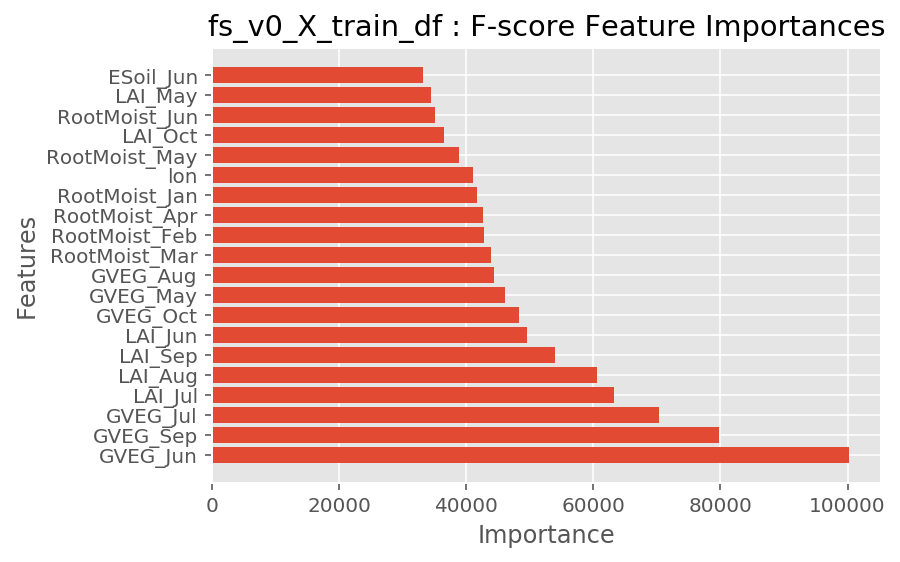

array(['GVEG_Jun', 'GVEG_Sep', 'GVEG_Jul', 'LAI_Jul', 'LAI_Aug',
       'LAI_Sep', 'LAI_Jun', 'GVEG_Oct', 'GVEG_May', 'GVEG_Aug',
       'RootMoist_Mar', 'RootMoist_Feb', 'RootMoist_Apr', 'RootMoist_Jan',
       'lon', 'RootMoist_May', 'LAI_Oct', 'RootMoist_Jun', 'LAI_May',
       'ESoil_Jun'], dtype=object)

In [39]:
f_regression_selector_v0_fscore, f_regression_selector_v0_features = utils.f_regression_selector(fs_v0_X_train_df, \
                                                                                          v0_y_train_df, \
                                                                                          fs_v0_X_columns, \
                                                                                          20)

utils.plot_importance(f_regression_selector_v0_features, f_regression_selector_v0_fscore, 'F-score', 'fs_v0_X_train_df')

f_regression_selector_v0_features

- ### Using `mutual_info_regression_selector`

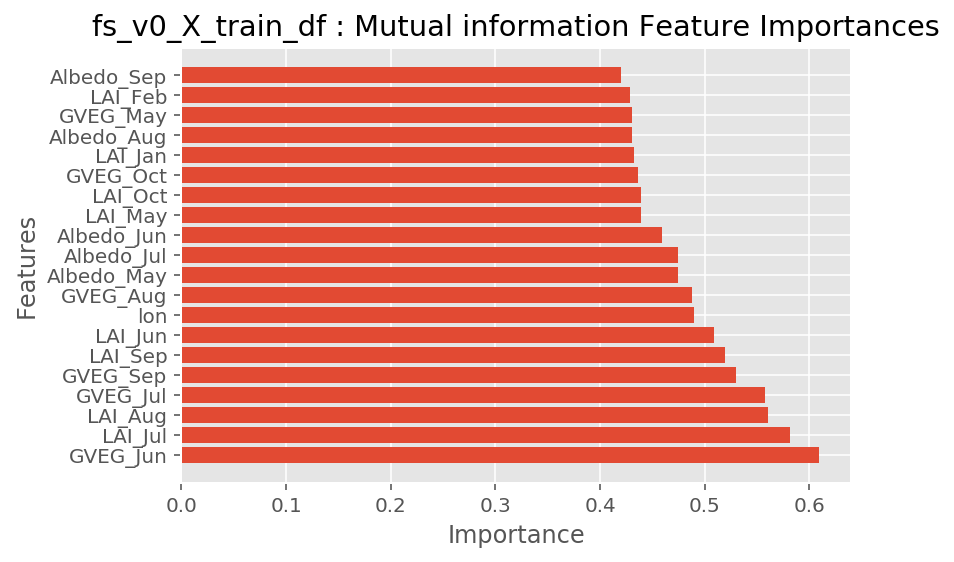

array(['GVEG_Jun', 'LAI_Jul', 'LAI_Aug', 'GVEG_Jul', 'GVEG_Sep',
       'LAI_Sep', 'LAI_Jun', 'lon', 'GVEG_Aug', 'Albedo_May',
       'Albedo_Jul', 'Albedo_Jun', 'LAI_May', 'LAI_Oct', 'GVEG_Oct',
       'LAI_Jan', 'Albedo_Aug', 'GVEG_May', 'LAI_Feb', 'Albedo_Sep'],
      dtype=object)

In [40]:
mif_v0_score, mif_v0_features = utils.mutual_info_regression_selector(fs_v0_X_train_df, \
                                                                      v0_y_train_df, \
                                                                      fs_v0_X_columns, \
                                                                      20)

utils.plot_importance(mif_v0_features, mif_v0_score, 'Mutual information', 'fs_v0_X_train_df')

mif_v0_features

### Feature ranking from `fs_v1_X_train_df` 

Since we have less than 20 features in `fs_v1_X_train_df`, we select all features from v1 and plot out their ranking. 

- ### Using `f_regression_selector`

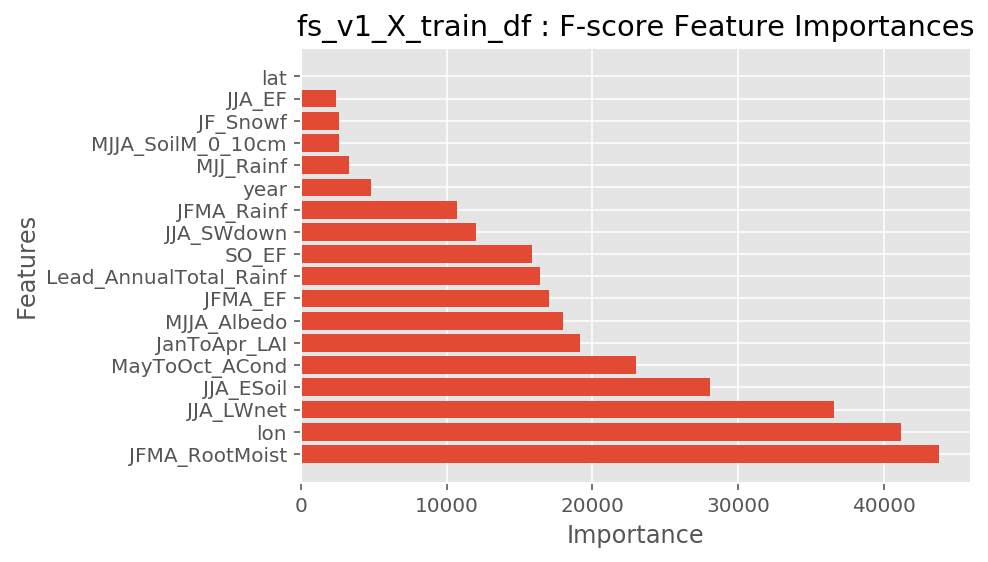

array(['JFMA_RootMoist', 'lon', 'JJA_LWnet', 'JJA_ESoil',
       'MayToOct_ACond', 'JanToApr_LAI', 'MJJA_Albedo', 'JFMA_EF',
       'Lead_AnnualTotal_Rainf', 'SO_EF', 'JJA_SWdown', 'JFMA_Rainf',
       'year', 'MJJ_Rainf', 'MJJA_SoilM_0_10cm', 'JF_Snowf', 'JJA_EF',
       'lat'], dtype=object)

In [41]:
f_regression_selector_v1_fscore, f_regression_selector_v1_features = utils.f_regression_selector(fs_v1_X_train_df, \
                                                                                          v1_y_train_df, \
                                                                                          fs_v1_X_columns, \
                                                                                          'all')

utils.plot_importance(f_regression_selector_v1_features, f_regression_selector_v1_fscore, 'F-score', 'fs_v1_X_train_df')

f_regression_selector_v1_features

- ### Using `mutual_info_regression_selector`

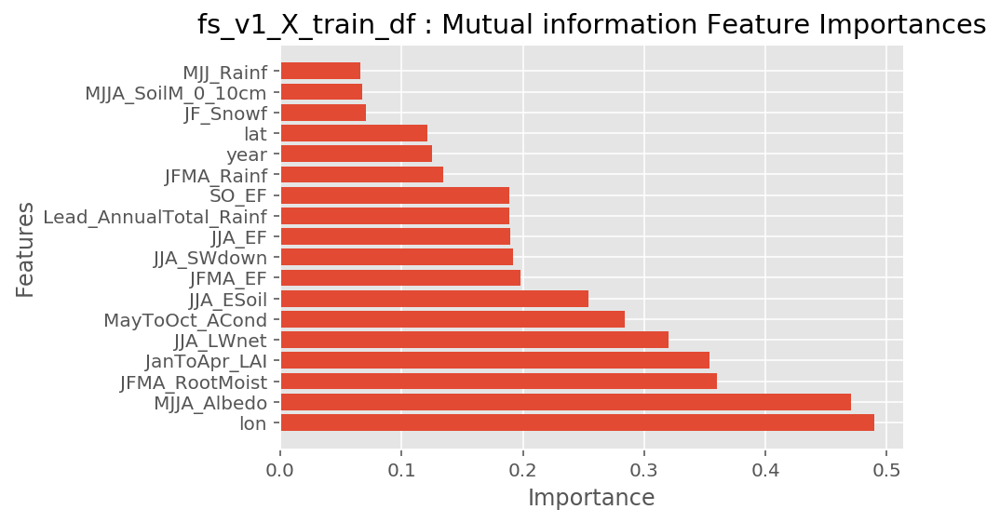

array(['lon', 'MJJA_Albedo', 'JFMA_RootMoist', 'JanToApr_LAI',
       'JJA_LWnet', 'MayToOct_ACond', 'JJA_ESoil', 'JFMA_EF',
       'JJA_SWdown', 'JJA_EF', 'Lead_AnnualTotal_Rainf', 'SO_EF',
       'JFMA_Rainf', 'year', 'lat', 'JF_Snowf', 'MJJA_SoilM_0_10cm',
       'MJJ_Rainf'], dtype=object)

In [42]:
mif_v1_score, mif_v1_features = utils.mutual_info_regression_selector(fs_v1_X_train_df, \
                                                                      v1_y_train_df, \
                                                                      fs_v1_X_columns, \
                                                                      'all')

utils.plot_importance(mif_v1_features, mif_v1_score, 'Mutual information', 'fs_v1_X_train_df')

mif_v1_features

---
<a id='section_3.3'></a>

## 3.3 Feature selection with `Lasso`

See [3.5](#section_3.5) for summary.

Back to [the table of contents](#section_t)

---
#### `Function: lasso_selector`

In [43]:
print(inspect.getdoc(utils.lasso_selector))

Feature selection using Lasso regression.

Parameters
----------
X_train: dataframe

y_train: dataframe

alpha: float

Returns
----------
Names of important features

Plot of feature importance


### Lasso feature selection for `fs_v0_X_train_df`

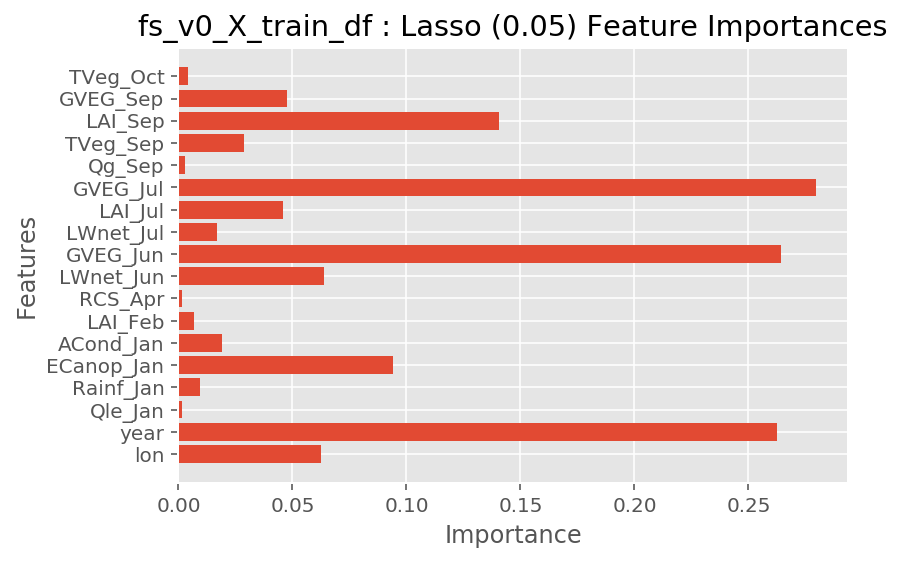

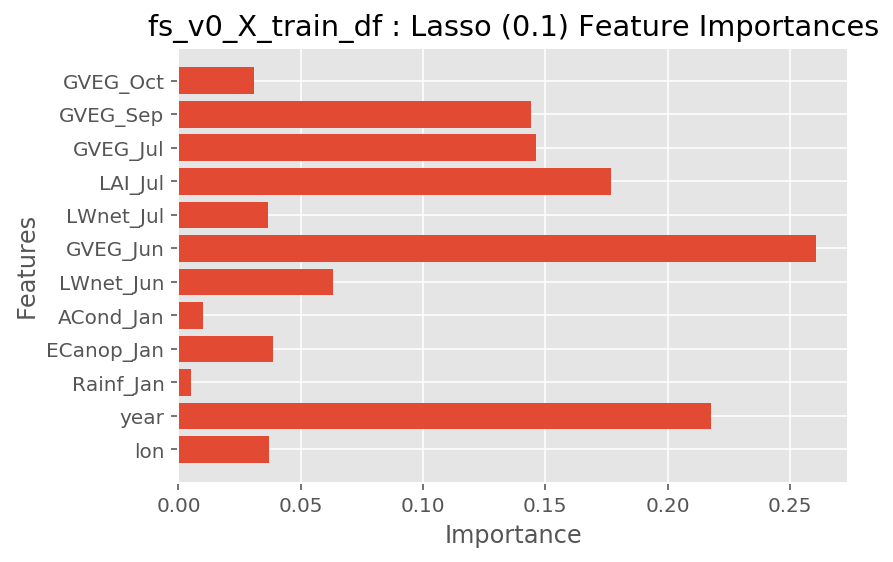

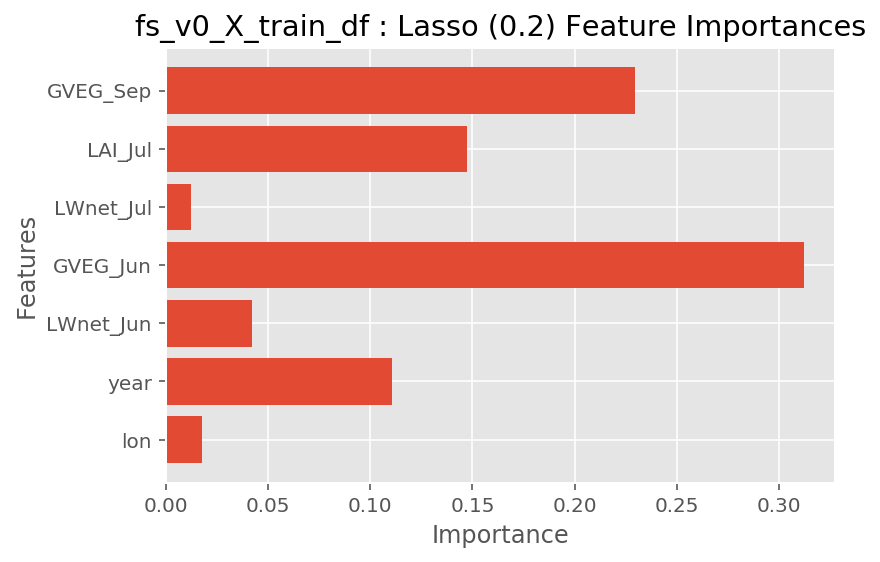

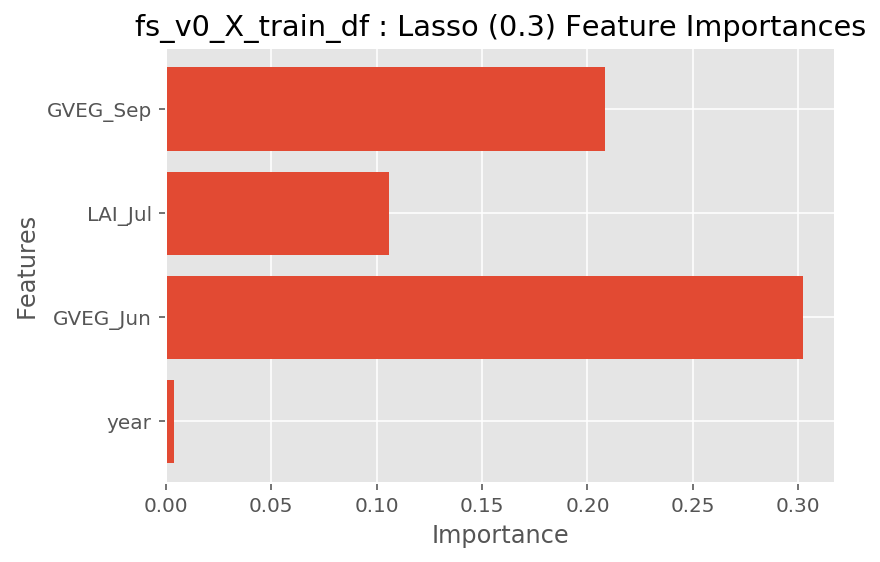

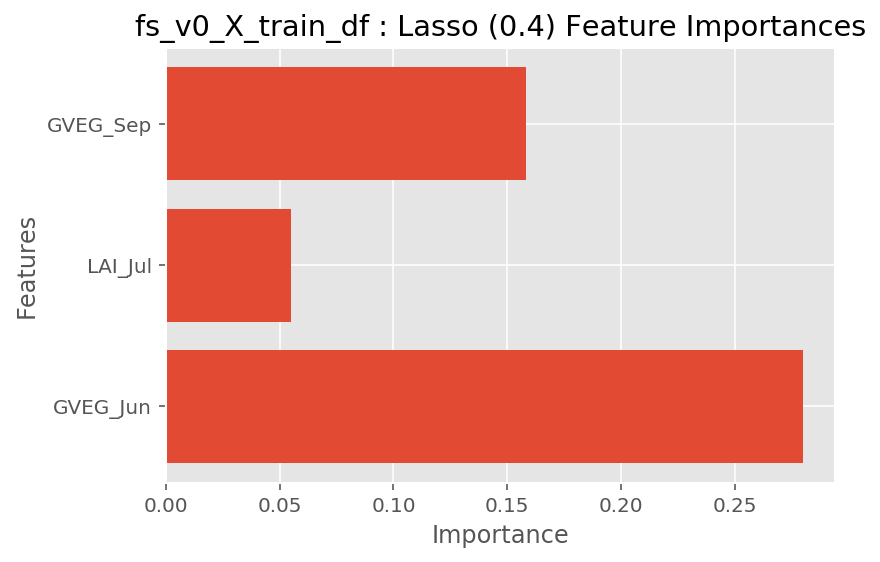

In [44]:
for alpha in (0.05, 0.1, 0.2, 0.3, 0.4):
    lasso_features, lasso_importance = utils.lasso_selector(fs_v0_X_train_df, v0_y_train_df, alpha)
    utils.plot_importance(np.array(lasso_features), np.array(lasso_importance), \
                          'Lasso ('+str(alpha)+')', 'fs_v0_X_train_df')

### Lasso feature selection for `fs_v1_X_train_df`

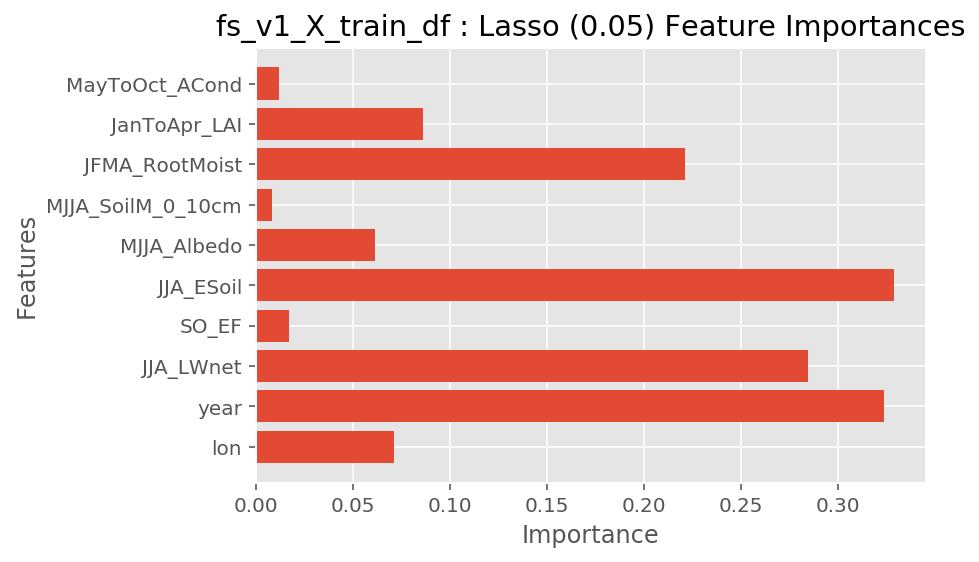

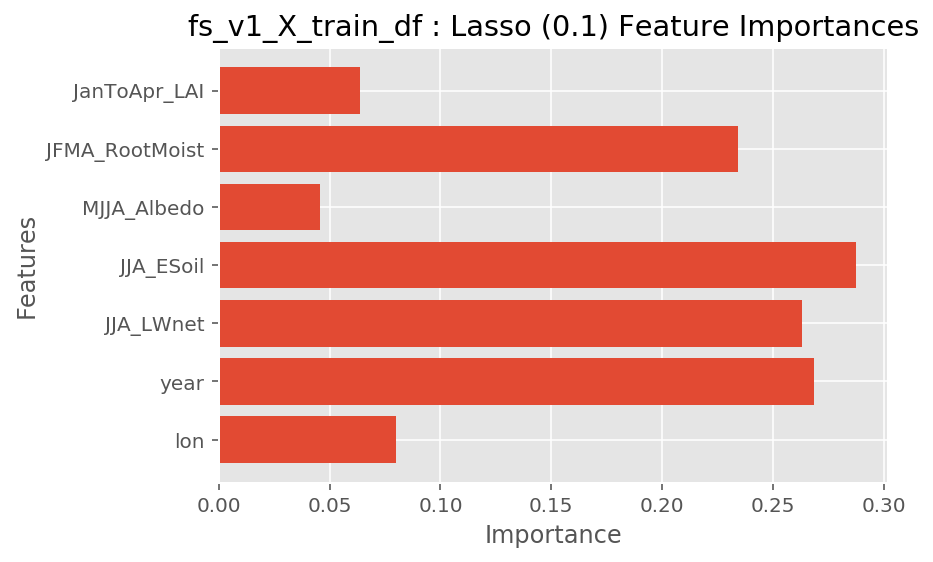

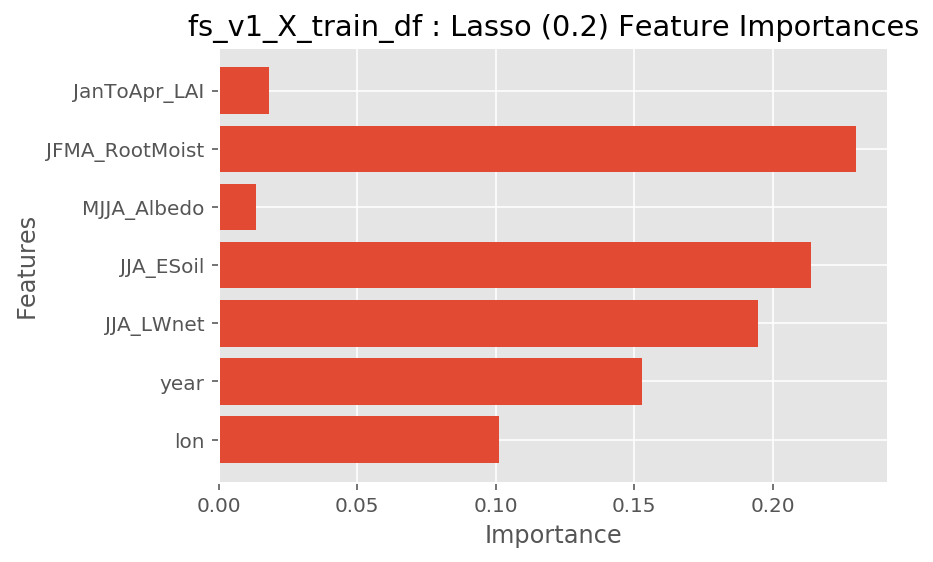

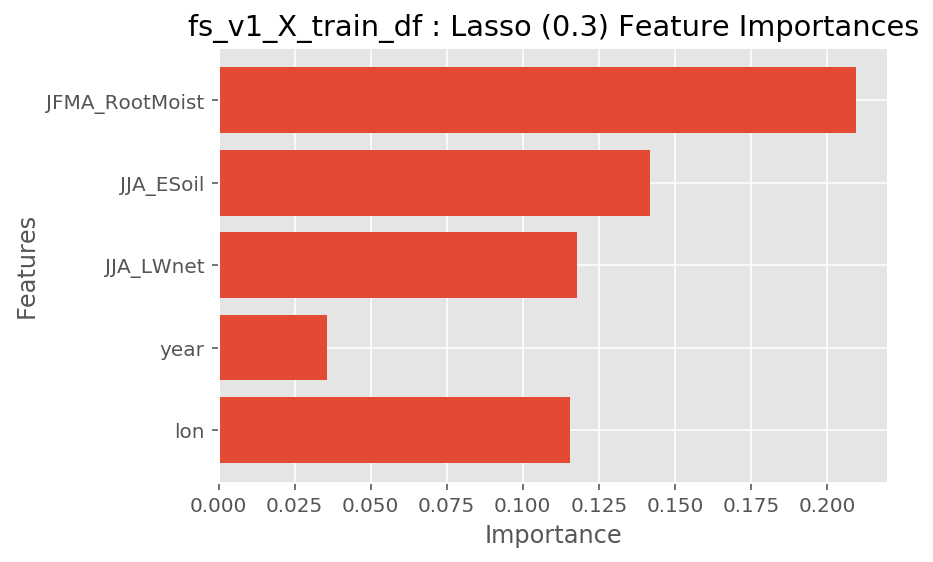

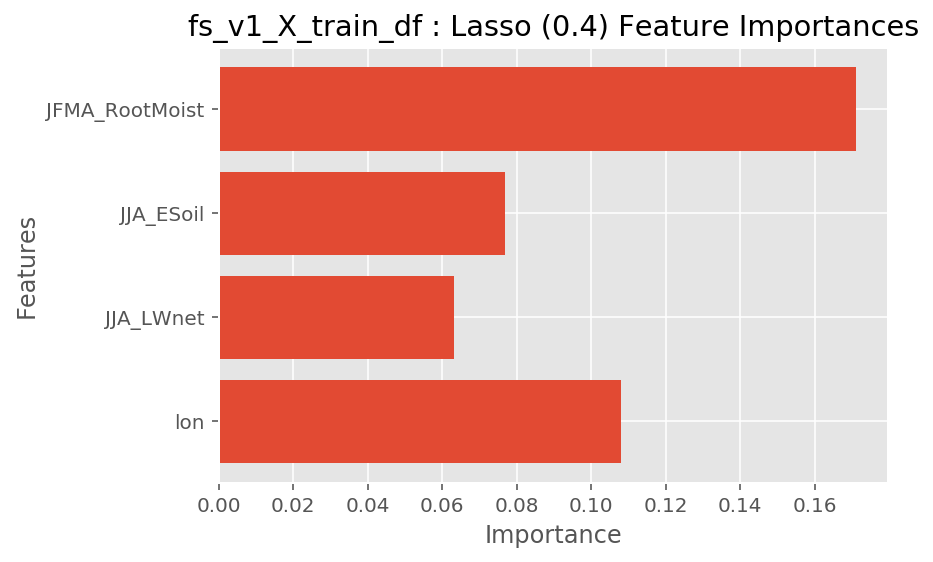

In [45]:
for alpha in (0.05, 0.1, 0.2, 0.3, 0.4):
    lasso_features, lasso_importance = utils.lasso_selector(fs_v1_X_train_df, v1_y_train_df, alpha)
    utils.plot_importance(np.array(lasso_features), np.array(lasso_importance), \
                          'Lasso ('+str(alpha)+')', 'fs_v1_X_train_df')

---
<a id='section_3.4'></a>

## 3.4 Feature selection with `SelectFromModel` in tree-based models

See [3.5](#section_3.5) for summary.

Back to [the table of contents](#section_t)

### `SelectFromModel` for `DecisionTreeRegressor()`

#### `Function: sel_decisiontree`

In [46]:
print(inspect.getdoc(utils.sel_decisiontree))

Feature selection by applying SelectFromModel method to DecisionTreeRegressor

Parameters
----------
X_train: dataframe

y_train: dataframe

Returns
----------
X_train_drop
X_train_keep


---
- #### `SelectFromModel` for `fs_v0_X_train_df` with `DecisionTreeRegressor()`

- 11 columns are selected. Note that I did not specify the random_state, so if you run the function a few times, you may get slightly different results. 

In [47]:
sel_decisiontree_v0_drop, sel_decisiontree_v0_keep = utils.sel_decisiontree(fs_v0_X_train_df, v0_y_train_df)

In [48]:
sel_decisiontree_v0_keep

,lon,year,GVEG_Jan,LAI_May,GVEG_May,ESoil_Jun,LAI_Jun,GVEG_Jun,GVEG_Jul,RSMacr_Oct,GVEG_Oct
0,252.25,1981,0.466892,2.033308,0.160971,17.451357,2.056855,0.171979,0.431167,0.266098,0.630000
1,261.75,1981,0.152922,3.420676,0.402857,47.241110,3.215281,0.364123,0.284191,0.156077,0.257372
2,251.75,1981,0.456763,2.041900,0.168723,11.831700,2.068441,0.180533,0.449900,0.261147,0.589569
3,252.25,1981,0.512532,3.046344,0.239956,14.334792,3.199451,0.288842,0.574170,0.342257,0.781945
4,261.25,1981,0.170864,3.617582,0.313050,56.287956,3.876653,0.325805,0.264748,0.189734,0.257932
...,...,...,...,...,...,...,...,...,...,...,...
51960,264.75,2015,0.040155,4.181577,0.508516,6.699237,5.048345,0.822222,0.892351,0.000000,0.349141
51961,287.25,2015,0.091776,5.140652,0.515219,13.702956,5.731948,0.769198,0.864028,0.000000,0.410672
51962,287.75,2015,0.066409,4.875169,0.489009,13.880886,5.418538,0.763078,0.860887,0.000000,0.399719
51963,288.25,2015,0.041042,4.609686,0.462799,14.058816,5.105128,0.756958,0.857746,0.000000,0.388765



- #### `SelectFromModel` for `fs_v1_X_train_df` with `DecisionTreeRegressor()`

- 3 columns are kept.

In [49]:
sel_decisiontree_v1_drop, sel_decisiontree_v1_keep = utils.sel_decisiontree(fs_v1_X_train_df, v1_y_train_df)

In [50]:
sel_decisiontree_v1_keep

,lon,year,MayToOct_ACond
0,252.25,1981,0.024078
1,261.75,1981,0.030089
2,251.75,1981,0.023941
3,252.25,1981,0.023328
4,261.25,1981,0.021317
...,...,...,...
51960,264.75,2015,0.029144
51961,287.25,2015,0.031004
51962,287.75,2015,0.029874
51963,288.25,2015,0.028743


---
### `SelectFromModel` for `RandomForestRegressor()`

#### It's interesting that the SelectFromModel method selects identical features for DecisionTreeRegressor and RandomForestRegressor

#### `Function: sel_randomforest`

In [51]:
print(inspect.getdoc(utils.sel_randomforest))

Feature selection by applying SelectFromModel method to RandomForestRegressor

Parameters
----------
X_train: dataframe

y_train: dataframe

Returns
----------
X_train_drop
X_train_keep


---
- #### `SelectFromModel` for `fs_v0_X_train_df` with `RandomForestRegressor()`


In [52]:
sel_randomforest_v0_drop, sel_randomforest_v0_keep = utils.sel_randomforest(fs_v0_X_train_df, v0_y_train_df)
sel_randomforest_v0_keep

,lon,year,GVEG_Jan,LAI_May,GVEG_May,ESoil_Jun,LAI_Jun,GVEG_Jun,GVEG_Jul,LAI_Oct,GVEG_Oct
0,252.25,1981,0.466892,2.033308,0.160971,17.451357,2.056855,0.171979,0.431167,3.073271,0.630000
1,261.75,1981,0.152922,3.420676,0.402857,47.241110,3.215281,0.364123,0.284191,2.634722,0.257372
2,251.75,1981,0.456763,2.041900,0.168723,11.831700,2.068441,0.180533,0.449900,3.015503,0.589569
3,252.25,1981,0.512532,3.046344,0.239956,14.334792,3.199451,0.288842,0.574170,4.746787,0.781945
4,261.25,1981,0.170864,3.617582,0.313050,56.287956,3.876653,0.325805,0.264748,2.873339,0.257932
...,...,...,...,...,...,...,...,...,...,...,...
51960,264.75,2015,0.040155,4.181577,0.508516,6.699237,5.048345,0.822222,0.892351,3.741169,0.349141
51961,287.25,2015,0.091776,5.140652,0.515219,13.702956,5.731948,0.769198,0.864028,4.896607,0.410672
51962,287.75,2015,0.066409,4.875169,0.489009,13.880886,5.418538,0.763078,0.860887,4.690360,0.399719
51963,288.25,2015,0.041042,4.609686,0.462799,14.058816,5.105128,0.756958,0.857746,4.484113,0.388765


---
- #### `SelectFromModel` for `fs_v1_X_train_df` with `RandomForestRegressor()`


In [53]:
sel_randomforest_v1_drop, sel_randomforest_v1_keep = utils.sel_randomforest(fs_v1_X_train_df, v1_y_train_df)
sel_randomforest_v1_keep

,lon,year,MayToOct_ACond
0,252.25,1981,0.024078
1,261.75,1981,0.030089
2,251.75,1981,0.023941
3,252.25,1981,0.023328
4,261.25,1981,0.021317
...,...,...,...
51960,264.75,2015,0.029144
51961,287.25,2015,0.031004
51962,287.75,2015,0.029874
51963,288.25,2015,0.028743


---
### `SelectFromModel` for `xgboost.XGBRegressor()`

#### This approach selects more features than the above two. 

#### `Function: sel_xgboost`

In [54]:
print(inspect.getdoc(utils.sel_xgboost))

Feature selection by applying SelectFromModel method to xgboost.XGBRegressor

Parameters
----------
X_train: dataframe

y_train: dataframe

Returns
----------
X_train_drop
X_train_keep


---
- #### `SelectFromModel` for `fs_v0_X_train_df` with `xgboost.XGBRegressor()`


In [55]:
sel_xgboost_v0_drop, sel_xgboost_v0_keep = utils.sel_xgboost(fs_v0_X_train_df, v0_y_train_df)
sel_xgboost_v0_keep

,lon,year,RSmin_Jan,GVEG_Jan,SMLiq_40_100cm_Feb,RCS_Feb,RCSOL_Feb,SWE_Mar,SoilT_100_200cm_Mar,SMLiq_100_200cm_Mar,...,AvgSurfT_Aug,SoilM_100_200cm_Aug,SoilT_100_200cm_Sep,SoilM_100_200cm_Sep,RCS_Sep,GVEG_Sep,RCSOL_Oct,RSMacr_Oct,LAI_Oct,GVEG_Oct
0,252.25,1981,70.00000,0.466892,125.647220,0.312959,0.380226,0.000000,291.976000,153.782930,...,301.52300,160.37073,299.340640,181.83125,0.324785,0.786061,0.598284,0.266098,3.073271,0.630000
1,261.75,1981,70.00000,0.152922,169.584460,0.307733,0.464231,0.000000,291.155640,240.359010,...,302.30760,229.68985,300.257720,260.54648,0.358758,0.235392,0.558200,0.156077,2.634722,0.257372
2,251.75,1981,70.00000,0.456763,128.804470,0.309535,0.431005,0.000000,291.905900,165.218140,...,302.43530,188.71790,299.867830,223.80016,0.324020,0.765546,0.688191,0.261147,3.015503,0.589569
3,252.25,1981,70.00000,0.512532,152.360440,0.282792,0.292363,0.000413,289.393520,149.506100,...,298.59555,172.91522,296.741060,215.94618,0.278763,0.892635,0.593243,0.342257,4.746787,0.781945
4,261.25,1981,138.75000,0.170864,184.137420,0.307848,0.526088,0.000000,290.518250,299.688720,...,303.38007,307.68338,300.679720,325.06630,0.347217,0.223420,0.626837,0.189734,2.873339,0.257932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51960,264.75,2015,122.50001,0.040155,30.627195,0.269251,0.000000,2.587966,263.488130,53.406730,...,292.60602,201.98985,285.510620,183.95550,0.323487,0.637430,0.325029,0.000000,3.741169,0.349141
51961,287.25,2015,237.50000,0.091776,97.332120,0.296343,0.000211,187.736180,273.205020,220.408750,...,292.27118,300.95020,284.648130,288.45862,0.351798,0.723134,0.422675,0.000000,4.896607,0.410672
51962,287.75,2015,211.25000,0.066409,92.742873,0.281838,0.000108,176.021875,273.232395,211.713485,...,292.40558,304.63794,284.649795,291.24353,0.333084,0.709653,0.427063,0.000000,4.690360,0.399719
51963,288.25,2015,185.00000,0.041042,88.153625,0.267333,0.000005,164.307570,273.259770,203.018220,...,292.53998,308.32568,284.651460,294.02844,0.314370,0.696173,0.431451,0.000000,4.484113,0.388765


---
- #### `SelectFromModel` for `fs_v1_X_train_df` with `xgboost.XGBRegressor()`

In [56]:
sel_xgboost_v1_drop, sel_xgboost_v1_keep = utils.sel_xgboost(fs_v1_X_train_df, v1_y_train_df)
sel_xgboost_v1_keep

,lon,year,JJA_EF,MayToOct_ACond
0,252.25,1981,0.441266,0.024078
1,261.75,1981,0.408907,0.030089
2,251.75,1981,0.452311,0.023941
3,252.25,1981,0.497514,0.023328
4,261.25,1981,0.399829,0.021317
...,...,...,...,...
51960,264.75,2015,0.258199,0.029144
51961,287.25,2015,0.337376,0.031004
51962,287.75,2015,0.346060,0.029874
51963,288.25,2015,0.354982,0.028743


---
<a id='section_3.5'></a>

## 3.5 Update X_train and X_test based on feature selection

Based on what we learned from [3.2](#section_3.2), [3.3](#section_3.3), and [3.4](#section_3.4), we update the features to be used for model training. Recall that we have `fs_v0_X_train_df`, `fs_v0_X_test_df`, `fs_v1_X_train_df`, `fs_v1_X_test_df`. In this section, we will create two new dataframes, `X_train_df` and `X_test_df`, which will be used for hyperparameter tuning. 

Note that we still should rely on our domain knowledge to decide to what extent we want to follow the suggestions from the above feature selection procedures. 

Back to [the table of contents](#section_t)

---
### Selected features from f_regression and mutual_info_regression (see [3.2](#section_3.2))

#### Note that the selected features printed in below are ranked in a descending order (from being more important to less important).

- #### fs_v0_X_train_df

    - There are many overlaps between the f_regression selected and mutual_info_regression selected features. 
    
    - We won't consider the GVEG and LAI in warm season because:
        - These vegetation indices directly reflect the growth of soybean during the warm season. In other words, including those features in our model is a bit of cheating.
    
    - We won't consider the RootMoist in Jan, Feb, Mar, Apr because:
        - We already include Jan to Apr averaged RootMoist in v1, and RootMoist is highly correlated across months.
        
    - We won't consider Albedo in May, Jun, Jul, Aug, Sep because:
        - We already include May to Aug averaged Albedo in v1. 
    
    - We won't consider ESoil_Jun because:
        - We already include JJA_ESoil in v1.
    
    - Below are variables that we could consider to include:
        - RootMoist_May
        - RootMoist_Jun

In [57]:
f_regression_selector_v0_features

array(['GVEG_Jun', 'GVEG_Sep', 'GVEG_Jul', 'LAI_Jul', 'LAI_Aug',
       'LAI_Sep', 'LAI_Jun', 'GVEG_Oct', 'GVEG_May', 'GVEG_Aug',
       'RootMoist_Mar', 'RootMoist_Feb', 'RootMoist_Apr', 'RootMoist_Jan',
       'lon', 'RootMoist_May', 'LAI_Oct', 'RootMoist_Jun', 'LAI_May',
       'ESoil_Jun'], dtype=object)

In [58]:
mif_v0_features

array(['GVEG_Jun', 'LAI_Jul', 'LAI_Aug', 'GVEG_Jul', 'GVEG_Sep',
       'LAI_Sep', 'LAI_Jun', 'lon', 'GVEG_Aug', 'Albedo_May',
       'Albedo_Jul', 'Albedo_Jun', 'LAI_May', 'LAI_Oct', 'GVEG_Oct',
       'LAI_Jan', 'Albedo_Aug', 'GVEG_May', 'LAI_Feb', 'Albedo_Sep'],
      dtype=object)

---
- #### fs_v1_X_train_df

    - The f_regression and mutual_info_regression methods give different ranking orders among the 18 features in v1. 
    
    - The feature ranking gives us some sense which features might be trivial, but we don't discard any features from v1 for now. 
        

In [59]:
f_regression_selector_v1_features

array(['JFMA_RootMoist', 'lon', 'JJA_LWnet', 'JJA_ESoil',
       'MayToOct_ACond', 'JanToApr_LAI', 'MJJA_Albedo', 'JFMA_EF',
       'Lead_AnnualTotal_Rainf', 'SO_EF', 'JJA_SWdown', 'JFMA_Rainf',
       'year', 'MJJ_Rainf', 'MJJA_SoilM_0_10cm', 'JF_Snowf', 'JJA_EF',
       'lat'], dtype=object)

In [60]:
mif_v1_features

array(['lon', 'MJJA_Albedo', 'JFMA_RootMoist', 'JanToApr_LAI',
       'JJA_LWnet', 'MayToOct_ACond', 'JJA_ESoil', 'JFMA_EF',
       'JJA_SWdown', 'JJA_EF', 'Lead_AnnualTotal_Rainf', 'SO_EF',
       'JFMA_Rainf', 'year', 'lat', 'JF_Snowf', 'MJJA_SoilM_0_10cm',
       'MJJ_Rainf'], dtype=object)

---
### Selected features from Lasso (see [3.3](#section_3.3))

#### Our Lasso feature selection selects features whose regression coefficients are not zero. We tried four sets of alpha parameters (0.1, 0.2, 0.3, 0.4), and as expected, larger alpha results more shrinkage and fewer selected features.  

- #### fs_v0_X_train_df

    - Similar to the f_regression and mutual_info_regression results, Lasso found close connection between soybean yield and LAI, GVEG. 
    
    - Lasso also suggests the following new features that we did not consider before. It's interesting that they are from the beginning months of the year, maybe suggesting some connection between soybean annual yield and climate prior to the soybean season.  
        - ECanop_Jan (canopy evapotranspiration)
        - ACond_Jan (aerodynamic conductance)
        - Qle_Jan (latent heat flux)

In [61]:
for alpha in (0.05, 0.1, 0.2, 0.3, 0.4):
    lasso_features, lasso_importance = utils.lasso_selector(fs_v0_X_train_df, v0_y_train_df, alpha)
    print(lasso_features)

Index(['lon', 'year', 'Qle_Jan', 'Rainf_Jan', 'ECanop_Jan', 'ACond_Jan',
       'LAI_Feb', 'RCS_Apr', 'LWnet_Jun', 'GVEG_Jun', 'LWnet_Jul', 'LAI_Jul',
       'GVEG_Jul', 'Qg_Sep', 'TVeg_Sep', 'LAI_Sep', 'GVEG_Sep', 'TVeg_Oct'],
      dtype='object')
Index(['lon', 'year', 'Rainf_Jan', 'ECanop_Jan', 'ACond_Jan', 'LWnet_Jun',
       'GVEG_Jun', 'LWnet_Jul', 'LAI_Jul', 'GVEG_Jul', 'GVEG_Sep', 'GVEG_Oct'],
      dtype='object')
Index(['lon', 'year', 'LWnet_Jun', 'GVEG_Jun', 'LWnet_Jul', 'LAI_Jul',
       'GVEG_Sep'],
      dtype='object')
Index(['year', 'GVEG_Jun', 'LAI_Jul', 'GVEG_Sep'], dtype='object')
Index(['GVEG_Jun', 'LAI_Jul', 'GVEG_Sep'], dtype='object')


- #### fs_v1_X_train_df

    - For v1, I think Lasso helps to highlight the most important features.

In [62]:
for alpha in (0.05, 0.1, 0.2, 0.3, 0.4):
    lasso_features, lasso_importance = utils.lasso_selector(fs_v1_X_train_df, v1_y_train_df, alpha)
    print(lasso_features)

Index(['lon', 'year', 'JJA_LWnet', 'SO_EF', 'JJA_ESoil', 'MJJA_Albedo',
       'MJJA_SoilM_0_10cm', 'JFMA_RootMoist', 'JanToApr_LAI',
       'MayToOct_ACond'],
      dtype='object')
Index(['lon', 'year', 'JJA_LWnet', 'JJA_ESoil', 'MJJA_Albedo',
       'JFMA_RootMoist', 'JanToApr_LAI'],
      dtype='object')
Index(['lon', 'year', 'JJA_LWnet', 'JJA_ESoil', 'MJJA_Albedo',
       'JFMA_RootMoist', 'JanToApr_LAI'],
      dtype='object')
Index(['lon', 'year', 'JJA_LWnet', 'JJA_ESoil', 'JFMA_RootMoist'], dtype='object')
Index(['lon', 'JJA_LWnet', 'JJA_ESoil', 'JFMA_RootMoist'], dtype='object')


---
### Selected features from SelectFromModel with tree-based models (see [3.4](#section_3.4))

<div class="alert alert-block alert-danger">

### Note:
    
  - I don't fully buy the selected features by the SelectFromModel method with the tree models.
    
</div>

In [63]:
sel_decisiontree_v0_keep_features = sel_decisiontree_v0_keep.columns
sel_randomforest_v0_keep_features = sel_randomforest_v0_keep.columns
sel_xgboost_v0_keep_features      = sel_xgboost_v0_keep.columns
sel_decisiontree_v1_keep_features = sel_decisiontree_v1_keep.columns
sel_randomforest_v1_keep_features = sel_randomforest_v1_keep.columns
sel_xgboost_v1_keep_features      = sel_xgboost_v1_keep.columns

- #### fs_v0_X_train_df

    - Decision Tree and Random Forests give similar feature selections, while XGBoost selected much more features. Based on our previous EDA notebook and our domain knowledge, some features suggested here are likely not useful. We intend to include the following features that's suggested by these tree-based models: 
    
        - 'GVEG_Jan', 'GVEG_Apr',
    
        - 'SWE_Mar', 'SWE_Apr', (snow water equivalent)
    
        - 'SoilT_100_200cm_Sep', (may affect harvest)
    
        - 'SoilM_100_200cm_Sep', (may affect harvest) 
    
        - 'LWnet_May', 
    
        - 'ESoil_May', , 
     
        - 'AvgSurfT_Aug', 
        
      

In [64]:
sel_decisiontree_v0_keep_features

Index(['lon', 'year', 'GVEG_Jan', 'LAI_May', 'GVEG_May', 'ESoil_Jun',
       'LAI_Jun', 'GVEG_Jun', 'GVEG_Jul', 'RSMacr_Oct', 'GVEG_Oct'],
      dtype='object')

In [65]:
sel_randomforest_v0_keep_features

Index(['lon', 'year', 'GVEG_Jan', 'LAI_May', 'GVEG_May', 'ESoil_Jun',
       'LAI_Jun', 'GVEG_Jun', 'GVEG_Jul', 'LAI_Oct', 'GVEG_Oct'],
      dtype='object')

In [66]:
sel_xgboost_v0_keep_features

Index(['lon', 'year', 'RSmin_Jan', 'GVEG_Jan', 'SMLiq_40_100cm_Feb', 'RCS_Feb',
       'RCSOL_Feb', 'SWE_Mar', 'SoilT_100_200cm_Mar', 'SMLiq_100_200cm_Mar',
       'SWE_Apr', 'SoilM_0_200cm_Apr', 'SMLiq_0_10cm_Apr', 'GVEG_Apr',
       'LWnet_May', 'SoilM_0_200cm_May', 'SMLiq_10_40cm_May',
       'SMLiq_100_200cm_May', 'ESoil_May', 'LAI_May', 'GVEG_May', 'Qg_Jun',
       'Albedo_Jun', 'RootMoist_Jun', 'ESoil_Jun', 'RCQ_Jun', 'LAI_Jun',
       'GVEG_Jun', 'LWnet_Jul', 'Qle_Jul', 'Rainf_Jul', 'SoilT_40_100cm_Jul',
       'ESoil_Jul', 'CCond_Jul', 'RCQ_Jul', 'RCSOL_Jul', 'LAI_Jul', 'GVEG_Jul',
       'Qle_Aug', 'AvgSurfT_Aug', 'SoilM_100_200cm_Aug', 'SoilT_100_200cm_Sep',
       'SoilM_100_200cm_Sep', 'RCS_Sep', 'GVEG_Sep', 'RCSOL_Oct', 'RSMacr_Oct',
       'LAI_Oct', 'GVEG_Oct'],
      dtype='object')

- #### fs_v1_X_train_df
    - I am surprised that the tree-based models would select so few features from the v1. Why? It does not make sense to me.

In [67]:
sel_decisiontree_v1_keep_features

Index(['lon', 'year', 'MayToOct_ACond'], dtype='object')

In [68]:
sel_randomforest_v1_keep_features

Index(['lon', 'year', 'MayToOct_ACond'], dtype='object')

In [69]:
sel_xgboost_v1_keep_features

Index(['lon', 'year', 'JJA_EF', 'MayToOct_ACond'], dtype='object')

<div class="alert alert-block alert-info">

### Summary
    
We will add following features to v1 based on 3.2 and 3.3
    
   - RootMoist_May
    
   - RootMoist_Jun

   - ECanop_Jan (canopy evapotranspiration)

   - ACond_Jan (aerodynamic conductance)

   - Qle_Jan (latent heat flux)

We will add following features to v1 based on 3.4   
   
   - 'GVEG_Jan', 'GVEG_Apr',
    
   - 'SWE_Mar', 'SWE_Apr', (snow water equivalent)
    
   - 'SoilT_100_200cm_Sep', (may affect harvest)
    
   - 'SoilM_100_200cm_Sep', (may affect harvest) 
    
   - 'LWnet_May', 
    
   - 'ESoil_May', , 
     
   - 'AvgSurfT_Aug', 

</div>

---
### Create df_v2 and check the correlation matrix

In [70]:
df_v2 = df_v1.copy(deep=True)

In [71]:
new_feature_column = ['RootMoist_May', 'RootMoist_Jun', 'ECanop_Jan', 'ACond_Jan', 'Qle_Jan', \
                      'GVEG_Jan', 'GVEG_Apr', 'SWE_Mar', 'SWE_Apr', 'SoilT_100_200cm_Sep', 'SoilM_100_200cm_Sep',\
                      'LWnet_May', 'ESoil_May', 'AvgSurfT_Aug']

for column in new_feature_column:
    df_v2[column]  = df_v0[column]

In [72]:
df_v2.head()

,lat,lon,year,yield,JJA_SWdown,JJA_LWnet,JFMA_EF,JJA_EF,SO_EF,JFMA_Rainf,...,Qle_Jan,GVEG_Jan,GVEG_Apr,SWE_Mar,SWE_Apr,SoilT_100_200cm_Sep,SoilM_100_200cm_Sep,LWnet_May,ESoil_May,AvgSurfT_Aug
0,25.25,252.25,1981,1.222455,252.770920,-48.225912,0.285506,0.441266,0.586137,46.581851,...,49.757866,0.466892,0.249145,0.000000,0.0,299.34064,181.83125,-87.474260,13.730376,301.52300
1,25.25,261.75,1981,0.730697,270.749867,-49.791474,0.300171,0.408907,0.388078,46.178984,...,30.156218,0.152922,0.343516,0.000000,0.0,300.25772,260.54648,-61.706192,44.655716,302.30760
2,25.75,251.75,1981,0.720959,261.569297,-49.627482,0.263053,0.452311,0.589255,36.861862,...,50.223950,0.456763,0.247777,0.000000,0.0,299.86783,223.80016,-91.804440,6.168788,302.43530
3,25.75,252.25,1981,1.450878,249.793410,-51.367977,0.272385,0.497514,0.642816,42.882309,...,51.495888,0.512532,0.292966,0.000413,0.0,296.74106,215.94618,-90.066130,8.958919,298.59555
4,25.75,261.25,1981,1.049755,273.741840,-54.618190,0.308435,0.399829,0.386794,53.773328,...,26.840885,0.170864,0.293513,0.000000,0.0,300.67972,325.06630,-65.659210,53.038216,303.38007


In [73]:
corr_yield_year_lat_lon = df_v2[['yield', 'year', 'lat', 'lon']].corr()
corr_df_v2_yield_climate= df_v2.iloc[:,3:].corr()

In [74]:
plt.figure(figsize=(80,80), linewidth=20)
sns.set(font_scale=5)
res = sns.heatmap(corr_yield_year_lat_lon, annot=True, fmt='.1f', cmap='RdBu_r', vmin=-1, vmax=1)
res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 100, rotation=90)
res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 100, rotation=0)
res.xaxis.tick_top() # x axis on top
res.xaxis.set_label_position('top')
res.tick_params(length=0)
res.set_title('Yield versus Year, Lat, Lon', fontsize=200, fontweight='bold', y =  1.1)

Text(0.5, 1.1, 'Yield versus Year, Lat, Lon')

In [75]:
plt.figure(figsize=(80,80), linewidth=20)
sns.set(font_scale=5)
res = sns.heatmap(corr_df_v2_yield_climate, annot=True, fmt='.1f', cmap='RdBu_r', vmin=-1, vmax=1)
res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 100, rotation=90)
res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 100, rotation=0)
res.xaxis.tick_top() # x axis on top
res.xaxis.set_label_position('top')
res.tick_params(length=0)
res.set_title('Yield versus df_v2 climate', fontsize=200, fontweight='bold', y =  1.1)

Text(0.5, 1.1, 'Yield versus df_v2 climate')

### Based on the correlation matrix and exploratory scatter plot (not included in this notebook), I decide to drop following features in df_v2:

 - 'SWE_Mar' (no evident linear or nonlinear relationship with yield)
 
 - 'SWE_Apr' (no evident linear or nonlinear relationship with yield)
 
 - 'RootMoist_May' (redundant variable due to a 0.9 correlation coefficient with JFMA_RootMoist)
 
 - 'RootMoist_Jun (redundant variable due to a 0.9 correlation coefficient with JFMA_RootMoist)
 
 - 'GVEG_Jan' (due to high correlation with ECanop_Jan, suggesting these two are redundant features; in fact they are both related to vegetation cover)
 
 - 'SoilT_100_200cm_Sep' (due to 0.9 correlation coefficient with AvgSurfT_Aug; decide to keep AvgSurfT_Aug because of the latter has a stronger correlation with yield)

### Update df_v2

In [76]:
df_v2.drop(['SWE_Mar', 'SWE_Apr', 'RootMoist_May', 'RootMoist_Jun', 'GVEG_Jan', 'SoilT_100_200cm_Sep'], \
           axis=1, inplace=True)

In [77]:
df_v2.head()

,lat,lon,year,yield,JJA_SWdown,JJA_LWnet,JFMA_EF,JJA_EF,SO_EF,JFMA_Rainf,...,MayToOct_ACond,Lead_AnnualTotal_Rainf,ECanop_Jan,ACond_Jan,Qle_Jan,GVEG_Apr,SoilM_100_200cm_Sep,LWnet_May,ESoil_May,AvgSurfT_Aug
0,25.25,252.25,1981,1.222455,252.770920,-48.225912,0.285506,0.441266,0.586137,46.581851,...,0.024078,849.102356,12.380142,0.015078,49.757866,0.249145,181.83125,-87.474260,13.730376,301.52300
1,25.25,261.75,1981,0.730697,270.749867,-49.791474,0.300171,0.408907,0.388078,46.178984,...,0.030089,478.890076,3.808738,0.020324,30.156218,0.343516,260.54648,-61.706192,44.655716,302.30760
2,25.75,251.75,1981,0.720959,261.569297,-49.627482,0.263053,0.452311,0.589255,36.861862,...,0.023941,780.922180,9.975035,0.014463,50.223950,0.247777,223.80016,-91.804440,6.168788,302.43530
3,25.75,252.25,1981,1.450878,249.793410,-51.367977,0.272385,0.497514,0.642816,42.882309,...,0.023328,861.817261,11.661224,0.016064,51.495888,0.292966,215.94618,-90.066130,8.958919,298.59555
4,25.75,261.25,1981,1.049755,273.741840,-54.618190,0.308435,0.399829,0.386794,53.773328,...,0.021317,457.677155,3.810283,0.013958,26.840885,0.293513,325.06630,-65.659210,53.038216,303.38007


### Save df_v2

In [78]:
df_v2.to_csv(data_dir+'US_SoybeanYield_ClimateFeature_1981-2016_v2.csv')

### X_train, X_test, y_train, y_test

In [79]:
# ****************************
# Split from df_v2
# ****************************
X_train_df = df_v2[df_v2['year'] <= 2015].drop(['yield'], axis=1)
y_train_df = df_v2[df_v2['year'] <= 2015]['yield']
X_test_df  = df_v2[df_v2['year'] == 2016].drop(['yield'], axis=1)
y_test_df  = df_v2[df_v2['year'] == 2016]['yield']

X_train_values = X_train_df.values
y_train_values = y_train_df.values
X_test_values  = X_test_df.values
y_test_values  = y_test_df.values

print(X_train_values.shape, y_train_values.shape, X_test_values.shape, y_test_values.shape)

(51965, 26) (51965,) (1419, 26) (1419,)


In [80]:
# scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_values)
X_test_scaled  = scaler.transform(X_test_values)

### Repeat what we did in [section 2](#section_2) with X_train, y_train, and X_test, y_test


- ### Linear models

    - #### The linear models perform slightly worse using the updated dataframe compared to using v0. But we can see an improvement of the OLS and Ridge prediction compared to using v1. 
    
    - #### Overall, the results look good. 
    

OLS df_v2: test set R-squared: 0.7582429680293692
OLS df_v2: test Set RMSE: 0.5398937659232308
Ridge df_v2: test set R-squared: 0.7582215419468034
Ridge df_v2: test Set RMSE: 0.5399176898439103
Lasso(0.1) df_v2: test set R-squared: 0.5425663078927186
Lasso(0.1) df_v2: test Set RMSE: 0.7426476818778979


(array([0.4, 0.6, 0.8, 1. ]), <a list of 4 Text yticklabel objects>)

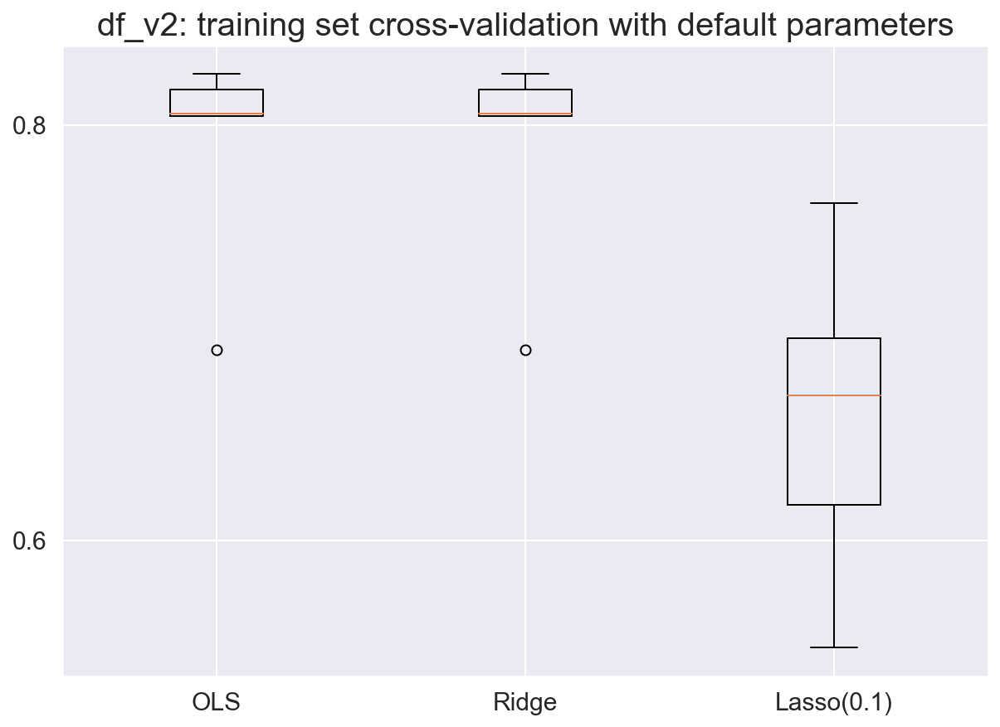

In [81]:
linear_models = {"OLS": LinearRegression(), \
                 "Ridge": Ridge(random_state=SEED), \
                 "Lasso(0.1)": Lasso(alpha=0.1, random_state=SEED)}

linear_models_cv   = []
linear_models_R2   = []
linear_models_RMSE = []

for name, model in linear_models.items():
    
    # Cross-validations
    cv_score = cross_val_score(model, X_train_scaled, y_train_values, cv=cv_split_indices)
    linear_models_cv.append(cv_score)
    
    # Fit and predict
    linear_steps    = [('scaler', StandardScaler()), \
                       (name, model)]
    
    linear_pipeline = Pipeline(linear_steps)
    
    linear_pipeline.fit(X_train_values, y_train_values)
    
    y_pred       = linear_pipeline.predict(X_test_values)
    
    R2 = linear_pipeline.score(X_test_values, y_test_values)
    
    RMSE = mean_squared_error(y_test_values, y_pred, squared=False)
    
    linear_models_R2.append(R2)
    linear_models_RMSE.append(RMSE)

    print("{} df_v2: test set R-squared: {}".format(name, R2))
    print("{} df_v2: test Set RMSE: {}".format(name, RMSE))

fig,ax = plt.subplots(figsize =(10, 7))
ax.boxplot(linear_models_cv, labels = linear_models.keys())
ax.set_title('df_v2: training set cross-validation with default parameters', fontsize= 20)
ax.set_xticklabels(linear_models.keys(), fontsize= 15)
plt.yticks(fontsize=15)

- ### Tree-based models

    - #### Tree-based models also slightly perform worse, but no much difference, and the $R^{2}$ is pretty high, close to 0.9 for XGBosst. 

DecisionTree df_v2: test set R-squared: 0.8136736375546003
DecisionTree df_v2: test Set RMSE: 0.4739755158602536
RandomForests df_v2: test set R-squared: 0.8678826691393463
RandomForests df_v2: test Set RMSE: 0.399115551832768
XGBoost df_v2: test set R-squared: 0.8936184284151638
XGBoost df_v2: test Set RMSE: 0.35813927993781697


(array([0.8 , 0.85, 0.9 , 0.95, 1.  ]), <a list of 5 Text yticklabel objects>)

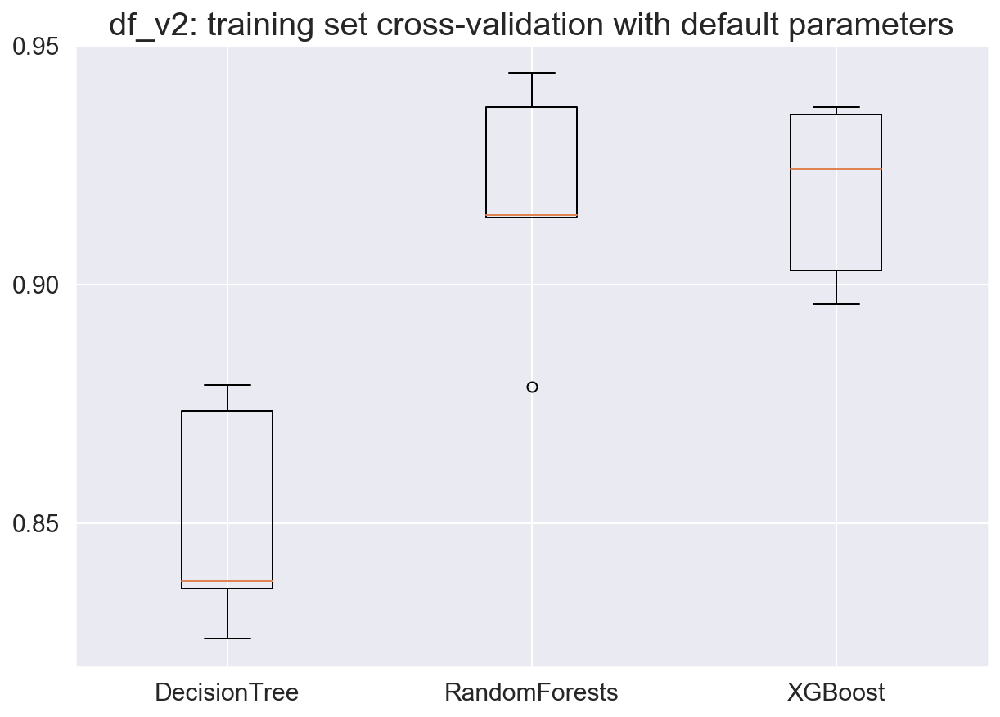

In [82]:
tree_models = {"DecisionTree": DecisionTreeRegressor(random_state=SEED), \
               "RandomForests": RandomForestRegressor(random_state=SEED), \
               "XGBoost": xgboost.XGBRegressor(random_state=SEED)}

tree_models_cv     = []
tree_models_R2     = []
tree_models_RMSE   = []

for name, model in tree_models.items():
    
    # Cross-validation
    cv_score = cross_val_score(model, X_train_scaled, y_train_values, cv=cv_split_indices)
    tree_models_cv.append(cv_score)
    
    # Fit and predict
    tree_steps    = [('scaler', StandardScaler()), \
                       (name, model)]
    
    tree_pipeline = Pipeline(tree_steps)
    
    tree_pipeline.fit(X_train_values, y_train_values)
    
    y_pred        = tree_pipeline.predict(X_test_values)
    
    R2            = tree_pipeline.score(X_test_values, y_test_values)

    RMSE          = mean_squared_error(y_test_values, y_pred, squared=False)
    
    tree_models_R2.append(R2)
    tree_models_RMSE.append(RMSE)

    print("{} df_v2: test set R-squared: {}".format(name, R2))
    print("{} df_v2: test Set RMSE: {}".format(name, RMSE))

fig,ax = plt.subplots(figsize =(10, 7))
ax.boxplot(tree_models_cv, labels = tree_models.keys())
ax.set_title('df_v2: training set cross-validation with default parameters', fontsize= 20)
ax.set_xticklabels(tree_models.keys(), fontsize= 15)
plt.yticks(fontsize=15)

---
<a id='section_4'></a>

# 4. Hyperparameter tuning with XGBoost

---
### Below are three commonly used tuning methods. Each method has its pros and cons. [This blog](https://towardsdatascience.com/grid-search-vs-random-search-vs-bayesian-optimization-2e68f57c3c46) provides nice summary and code examples of the three methods. 
 
   - #### Grid Search - use [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html)
 
   - #### Random Search - use [RandomizedSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html)
 
   - #### Bayesian Optimization - use [OPTUNA](https://optuna.org) framework.

### We will try both RandomizedSearchCV and Bayesian optimization. 

---
### Which hyperparameters to tune?

- [XGBoost Python Package: Python API Reference](https://xgboost.readthedocs.io/en/stable/python/python_api.html)

- [XGBoost Tutorials: Notes on Parameter Tuning](https://xgboost.readthedocs.io/en/stable/tutorials/param_tuning.html)
    > #### Control Overfitting
    > When you observe high training accuracy, but low test accuracy, it is likely that you encountered overfitting problem.
    > There are in general two ways that you can control overfitting in XGBoost:
    > The first way is to directly control **model complexity**.
    > This includes `max_depth`, `min_child_weight` and `gamma`.
    > The second way is to **add randomness** to make training robust to noise.
    > This includes `subsample` and `colsample_bytree`.
    > You can also reduce **stepsize** `eta`. Remember to increase `num_round` when you do so.
    
    > #### Faster training performance
    > There’s a parameter called `tree_method`, set it to `hist` or `gpu_hist` for faster computation.
    
- [XGBoost Parameters](https://xgboost.readthedocs.io/en/stable/parameter.html)
- [Amazon SageMaker Deverloper Guide: Tune an XGBoost Model](https://docs.aws.amazon.com/sagemaker/latest/dg/xgboost-tuning.html) 
    > The hyperparameters that have the greatest effect on optimizing the XGBoost evaluation metrics are `alpha`, `min_child_weight`, `subsample`, `eta`, and `num_round`

### We tune the following parameters to control overfitting

#### Note to check the exact parameter names in the class `xgboost.XGBRegressor` documented for the [Scikit-Learn API of XGBoost](https://xgboost.readthedocs.io/en/stable/python/python_api.html). 

   - `reg_alpha (optional [float])`
       > [default=0, alias: `reg_alpha`]
       
       > L1 regularization term on weights. Increasing this value will make model more conservative.
       
       > Recommended Range: [0, 1000]
       
   - `max_depth (optional [int])`
       > [default=6]
       
       > Maximum depth of a tree. Increasing this value will make the model more complex and more likely to overfit. 0 indicates no limit on depth. Beware that XGBoost aggressively consumes memory when training a deep tree. `exact` tree method requires non-zero value.
       
       > Recommended Range: [0,10]
    
   - `min_child_weight [optional [float]]`
       > [default=1]
       
       > Minimum sum of instance weight (hessian) needed in a child. If the tree partition step results in a leaf node with the sum of instance weight less than `min_child_weight`, then the building process will give up further partitioning. In linear regression task, this simply corresponds to minimum number of instances needed to be in each node. The larger `min_child_weight` is, the more conservative the algorithm will be.
       
       > Recommended Range: [0,120]
    
   - `gamma (optional [float])`
       > [default=0, alias: `min_split_loss`]
       
       > Minimum loss reduction required to make a further partition on a leaf node of the tree. The larger `gamma` is, the more conservative the algorithm will be.
       
       > Recommended Range: [0, 5]
    
   - `subsample (optional [float])`
       > [default=1]
       
       > Subsample ratio of the training instances. Setting it to 0.5 means that XGBoost would randomly sample half of the training data prior to growing trees. and this will prevent overfitting. Subsampling will occur once in every boosting iteration.
       
       > Recommended Range: [0.5, 1]
    
   - `colsample_bytree (optional [float])`
       
       > [default=1]
       
       > colsample_bytree is the subsample ratio of columns when constructing each tree. Subsampling occurs once for every tree constructed.
       
       > Recommended Range: [0.5, 1]
    
   - `learning_rate (optional [float])`
   
       > [default=0.3, alias: `learning_rate`]
       
       > Step size shrinkage used in update to prevents overfitting. After each boosting step, we can directly get the weights of new features, and `eta` shrinks the feature weights to make the boosting process more conservative.
       
       > Recommended Range: [0.1, 0.5]
    
   - `n_estimators (int)`
   
       > The number of rounds for boosting
       
       > Recommended Range: [1, 4000]
       
---
### Helpful tutorials

- [Grid Search VS Random Search VS Bayesian Optimization](https://towardsdatascience.com/grid-search-vs-random-search-vs-bayesian-optimization-2e68f57c3c46)

- [How to tune an XGBRegressor model with Optuna](https://practicaldatascience.co.uk/machine-learning/how-to-tune-an-xgbregressor-model-with-optuna)


Back to [the table of contents](#section_t)

---
<a id='section_4.1'></a>

## 4.1 RandomizedSearchCV

### Define the scaling and model pipeline, parameter search space, and instantiate RandomizedSearchCV

In [83]:
xgb_pipeline = Pipeline([
                         ('scaler', StandardScaler()), \
                         ('xgbR', xgboost.XGBRegressor(random_state=SEED))
                        ])

xgb_param  = {'xgbR__n_estimators': [10, 50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 800, 1000],\
              'xgbR__learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4], \
              'xgbR__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1], \
              'xgbR__subsample': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], \
              'xgbR__gamma': [0, 1, 2, 3, 4, 5], \
              'xgbR__min_child_weight': [0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 1], \
              'xgbR__max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], \
              'xgbR__reg_alpha': [0, 50, 100, 200, 300, 500, 1000]}

# Use RandomizedSearchCV
xgb_search = RandomizedSearchCV(xgb_pipeline, \
                                xgb_param,\
                                verbose=3, \
                                cv=cv_split_indices, \
                                scoring="r2", \
                                n_iter=40, \
                                random_state=SEED)

### Fine-tunning the parameters

In [84]:
xgb_time_start = time.time()
xgb_search.fit(X_train_values, y_train_values)
xgb_time_random= time.time() - xgb_time_start

# store results in a dataframe
xgb_values_grid=[[40, xgb_search.best_index_+1, xgb_search.best_score_, xgb_time_random]]
xgb_results_random = pd.DataFrame(xgb_values_grid, \
                                  columns = ['Number of iterations', \
                                             'Iteration Number of Optimal Hyperparamters', \
                                             'Score', \
                                             'Time Elapsed (s)'])

print("Tuned xgboost.XGBRegressor Parameters: {}, R-squared: {}".format(xgb_search.best_params_, \
                                                                xgb_search.best_score_))

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV 1/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.05, xgbR__max_depth=4, xgbR__min_child_weight=0.75, xgbR__n_estimators=400, xgbR__reg_alpha=0, xgbR__subsample=0.7;, score=0.916 total time=   9.9s
[CV 2/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.05, xgbR__max_depth=4, xgbR__min_child_weight=0.75, xgbR__n_estimators=400, xgbR__reg_alpha=0, xgbR__subsample=0.7;, score=0.902 total time=  10.6s
[CV 3/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.05, xgbR__max_depth=4, xgbR__min_child_weight=0.75, xgbR__n_estimators=400, xgbR__reg_alpha=0, xgbR__subsample=0.7;, score=0.915 total time=  10.4s
[CV 4/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.05, xgbR__max_depth=4, xgbR__min_child_weight=0.75, xgbR__n_estimators=400, xgbR__reg_alpha=0, xgbR__subsample=0.7;, score=0.860 total time=  10.1s
[CV 5/5] END xgbR__colsample_bytre

[CV 2/5] END xgbR__colsample_bytree=1, xgbR__gamma=2, xgbR__learning_rate=0.35, xgbR__max_depth=2, xgbR__min_child_weight=0.1, xgbR__n_estimators=50, xgbR__reg_alpha=300, xgbR__subsample=1;, score=0.842 total time=   0.6s
[CV 3/5] END xgbR__colsample_bytree=1, xgbR__gamma=2, xgbR__learning_rate=0.35, xgbR__max_depth=2, xgbR__min_child_weight=0.1, xgbR__n_estimators=50, xgbR__reg_alpha=300, xgbR__subsample=1;, score=0.848 total time=   0.6s
[CV 4/5] END xgbR__colsample_bytree=1, xgbR__gamma=2, xgbR__learning_rate=0.35, xgbR__max_depth=2, xgbR__min_child_weight=0.1, xgbR__n_estimators=50, xgbR__reg_alpha=300, xgbR__subsample=1;, score=0.742 total time=   0.7s
[CV 5/5] END xgbR__colsample_bytree=1, xgbR__gamma=2, xgbR__learning_rate=0.35, xgbR__max_depth=2, xgbR__min_child_weight=0.1, xgbR__n_estimators=50, xgbR__reg_alpha=300, xgbR__subsample=1;, score=0.810 total time=   0.7s
[CV 1/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=4, xgbR__learning_rate=0.3, xgbR__max_depth=1, xgbR__min_ch

[CV 4/5] END xgbR__colsample_bytree=0.6, xgbR__gamma=4, xgbR__learning_rate=0.3, xgbR__max_depth=8, xgbR__min_child_weight=0.25, xgbR__n_estimators=700, xgbR__reg_alpha=1000, xgbR__subsample=0.9;, score=0.712 total time=  18.4s
[CV 5/5] END xgbR__colsample_bytree=0.6, xgbR__gamma=4, xgbR__learning_rate=0.3, xgbR__max_depth=8, xgbR__min_child_weight=0.25, xgbR__n_estimators=700, xgbR__reg_alpha=1000, xgbR__subsample=0.9;, score=0.729 total time=  24.3s
[CV 1/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.4, xgbR__max_depth=8, xgbR__min_child_weight=0.01, xgbR__n_estimators=500, xgbR__reg_alpha=300, xgbR__subsample=0.3;, score=0.810 total time=   4.4s
[CV 2/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.4, xgbR__max_depth=8, xgbR__min_child_weight=0.01, xgbR__n_estimators=500, xgbR__reg_alpha=300, xgbR__subsample=0.3;, score=0.756 total time=   4.9s
[CV 3/5] END xgbR__colsample_bytree=0.8, xgbR__gamma=0, xgbR__learning_rate=0.4, xgbR__max

[CV 1/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=2, xgbR__learning_rate=0.2, xgbR__max_depth=8, xgbR__min_child_weight=0.1, xgbR__n_estimators=250, xgbR__reg_alpha=100, xgbR__subsample=1;, score=0.899 total time=  12.0s
[CV 2/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=2, xgbR__learning_rate=0.2, xgbR__max_depth=8, xgbR__min_child_weight=0.1, xgbR__n_estimators=250, xgbR__reg_alpha=100, xgbR__subsample=1;, score=0.874 total time=  12.9s
[CV 3/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=2, xgbR__learning_rate=0.2, xgbR__max_depth=8, xgbR__min_child_weight=0.1, xgbR__n_estimators=250, xgbR__reg_alpha=100, xgbR__subsample=1;, score=0.902 total time=  12.4s
[CV 4/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=2, xgbR__learning_rate=0.2, xgbR__max_depth=8, xgbR__min_child_weight=0.1, xgbR__n_estimators=250, xgbR__reg_alpha=100, xgbR__subsample=1;, score=0.827 total time=  12.1s
[CV 5/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=2, xgbR__learning_rate=0.2, xgbR__max_depth=8, xgbR

[CV 3/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=1, xgbR__learning_rate=0.25, xgbR__max_depth=10, xgbR__min_child_weight=0.1, xgbR__n_estimators=500, xgbR__reg_alpha=100, xgbR__subsample=0.3;, score=0.881 total time=  13.3s
[CV 4/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=1, xgbR__learning_rate=0.25, xgbR__max_depth=10, xgbR__min_child_weight=0.1, xgbR__n_estimators=500, xgbR__reg_alpha=100, xgbR__subsample=0.3;, score=0.811 total time=  14.2s
[CV 5/5] END xgbR__colsample_bytree=0.7, xgbR__gamma=1, xgbR__learning_rate=0.25, xgbR__max_depth=10, xgbR__min_child_weight=0.1, xgbR__n_estimators=500, xgbR__reg_alpha=100, xgbR__subsample=0.3;, score=0.837 total time=  15.1s
[CV 1/5] END xgbR__colsample_bytree=0.6, xgbR__gamma=5, xgbR__learning_rate=0.05, xgbR__max_depth=5, xgbR__min_child_weight=0.25, xgbR__n_estimators=100, xgbR__reg_alpha=1000, xgbR__subsample=0.4;, score=0.707 total time=   2.0s
[CV 2/5] END xgbR__colsample_bytree=0.6, xgbR__gamma=5, xgbR__learning_rate=0.05, xgbR_

[CV 4/5] END xgbR__colsample_bytree=0.6, xgbR__gamma=1, xgbR__learning_rate=0.25, xgbR__max_depth=6, xgbR__min_child_weight=0.05, xgbR__n_estimators=300, xgbR__reg_alpha=50, xgbR__subsample=0.9;, score=0.850 total time=  10.4s
[CV 5/5] END xgbR__colsample_bytree=0.6, xgbR__gamma=1, xgbR__learning_rate=0.25, xgbR__max_depth=6, xgbR__min_child_weight=0.05, xgbR__n_estimators=300, xgbR__reg_alpha=50, xgbR__subsample=0.9;, score=0.894 total time=  10.9s
[CV 1/5] END xgbR__colsample_bytree=1, xgbR__gamma=4, xgbR__learning_rate=0.01, xgbR__max_depth=2, xgbR__min_child_weight=0.01, xgbR__n_estimators=700, xgbR__reg_alpha=100, xgbR__subsample=1;, score=0.856 total time=   7.8s
[CV 2/5] END xgbR__colsample_bytree=1, xgbR__gamma=4, xgbR__learning_rate=0.01, xgbR__max_depth=2, xgbR__min_child_weight=0.01, xgbR__n_estimators=700, xgbR__reg_alpha=100, xgbR__subsample=1;, score=0.840 total time=   8.0s
[CV 3/5] END xgbR__colsample_bytree=1, xgbR__gamma=4, xgbR__learning_rate=0.01, xgbR__max_depth=2,

In [85]:
xgb_results_random

,Number of iterations,Iteration Number of Optimal Hyperparamters,Score,Time Elapsed (s)
0,40,11,0.918318,1604.932015


### Retain the model with the tuned params 

In [86]:
xgb_random_tuned_params = {'subsample': 0.8, \
                           'reg_alpha': 0, \
                           'n_estimators': 300, \
                           'min_child_weight': 0.5, \
                           'max_depth': 9, \
                           'learning_rate': 0.3, \
                           'gamma': 0, \
                           'colsample_bytree': 0.7, \
                           'random_state': SEED}

In [87]:
xgb_randomcv_retrain  = Pipeline([
                         ('scaler', StandardScaler()), \
                         ('xgbR', xgboost.XGBRegressor(**xgb_random_tuned_params))
                        ])

xgb_randomcv_retrain.fit(X_train_values, y_train_values)

xgb_randomcv_y_pred  = xgb_randomcv_retrain.predict(X_test_values)

xgb_randomcv_R2      = xgb_randomcv_retrain.score(X_test_values, y_test_values)

xgb_randomcv_RMSE    = mean_squared_error(y_test_values, xgb_randomcv_y_pred, squared=False)

print("XGBoost with randomizedsearch params (df_v2): test set R-squared: {}".format(xgb_randomcv_R2))
print("XGBoost with randomizedsearch params (df_v2): test Set RMSE: {}".format(xgb_randomcv_RMSE))
    

XGBoost with randomizedsearch params (df_v2): test set R-squared: 0.8965696429913581
XGBoost with randomizedsearch params (df_v2): test Set RMSE: 0.3531366290305626


---
<a id='section_4.2'></a>

## 4.2 Bayesian Optimization (OPTUNA framework)

Back to [the table of contents](#section_t)

### Define an objective function 

In [88]:
def objective(trial):
    """return the r2 (r-squared)"""
    
    # search space
    n_estimators     = trial.suggest_int('n_estimators', low=100, high=1000, step=50)
    learning_rate    = trial.suggest_float('learning_rate', 0.01, 0.4)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1)
    subsample        = trial.suggest_float('subsample', 0.3, 1)
    gamma            = trial.suggest_int('gamma', low=0, high=5, step=1)
    min_child_weight = trial.suggest_float('min_child_weight', 0.01, 1)
    max_depth        = trial.suggest_int('max_depth', low=1, high=10, step=1)
    reg_alpha        = trial.suggest_int('reg_alpha', low=0, high=1000, step=50)
    
    # xgboost.XGBRegressor() object
    xgbR = xgboost.XGBRegressor(n_estimators = n_estimators,\
                                learning_rate = learning_rate, \
                                colsample_bytree = colsample_bytree, \
                                subsample = subsample, \
                                gamma = gamma, \
                                min_child_weight = min_child_weight, \
                                max_depth = max_depth, \
                                reg_alpha = reg_alpha, \
                                random_state = SEED)
    
    
    # scaling 
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_values)
    X_test_scaled  = scaler.transform(X_test_values)
    
    # score
    score  = cross_val_score(estimator=xgbR, \
                             X = X_train_scaled, \
                             y = y_train_values, \
                             scoring = 'r2', \
                             cv=cv_split_indices).mean()
    
    return score

### Create a case study

In [89]:
optuna_study = optuna.create_study(sampler=TPESampler(), direction='maximize', study_name='XGBRegressor_optuna')

[I 2022-11-29 12:35:58,604] A new study created in memory with name: XGBRegressor_optuna


### Perform hyperparameter tuning (while timing the process)

In [90]:
optuna_time_start    = time.time()
optuna_study.optimize(objective, n_trials = 40)
xgb_time_bayesian = time.time() - optuna_time_start

[I 2022-11-29 12:36:32,125] Trial 0 finished with value: 0.7817043658820795 and parameters: {'n_estimators': 500, 'learning_rate': 0.14214839707012675, 'colsample_bytree': 0.929175353621274, 'subsample': 0.5233956768547762, 'gamma': 0, 'min_child_weight': 0.34900756434587793, 'max_depth': 7, 'reg_alpha': 700}. Best is trial 0 with value: 0.7817043658820795.
[I 2022-11-29 12:37:39,455] Trial 1 finished with value: 0.8644369005227901 and parameters: {'n_estimators': 300, 'learning_rate': 0.05324856286408144, 'colsample_bytree': 0.6633445324431193, 'subsample': 0.35400998974568, 'gamma': 2, 'min_child_weight': 0.8813744899928441, 'max_depth': 8, 'reg_alpha': 50}. Best is trial 1 with value: 0.8644369005227901.
[I 2022-11-29 12:37:49,613] Trial 2 finished with value: 0.8464892386224474 and parameters: {'n_estimators': 150, 'learning_rate': 0.1600581134899143, 'colsample_bytree': 0.5156042406341553, 'subsample': 0.8456661653010711, 'gamma': 2, 'min_child_weight': 0.51518771483351, 'max_dept

[I 2022-11-29 12:52:52,285] Trial 22 finished with value: 0.901382826926611 and parameters: {'n_estimators': 350, 'learning_rate': 0.37488212093103845, 'colsample_bytree': 0.6471876429864493, 'subsample': 0.3011538433681505, 'gamma': 1, 'min_child_weight': 0.022549671819245942, 'max_depth': 6, 'reg_alpha': 0}. Best is trial 14 with value: 0.9095269726901556.
[I 2022-11-29 12:53:11,966] Trial 23 finished with value: 0.8934813504821133 and parameters: {'n_estimators': 250, 'learning_rate': 0.2447813676272091, 'colsample_bytree': 0.5750904566030275, 'subsample': 0.38500432156943454, 'gamma': 2, 'min_child_weight': 0.5092209180920187, 'max_depth': 3, 'reg_alpha': 0}. Best is trial 14 with value: 0.9095269726901556.
[I 2022-11-29 12:53:47,337] Trial 24 finished with value: 0.8730866050419459 and parameters: {'n_estimators': 400, 'learning_rate': 0.28749976316194803, 'colsample_bytree': 0.6854569940090642, 'subsample': 0.4918237641458391, 'gamma': 0, 'min_child_weight': 0.2322410358923564, '

### Store results in a dataframe 

In [91]:
# store results in a dataframe
xgb_values_bayesian  =[[40, optuna_study.best_trial.number, optuna_study.best_trial.value, xgb_time_bayesian]]
xgb_results_bayesian = pd.DataFrame(xgb_values_bayesian, \
                                  columns = ['Number of iterations', \
                                             'Iteration Number of Optimal Hyperparamters', \
                                             'Score', \
                                             'Time Elapsed (s)'])

In [92]:
xgb_results_bayesian

,Number of iterations,Iteration Number of Optimal Hyperparamters,Score,Time Elapsed (s)
0,40,14,0.909527,1717.377685


In [93]:
print('OPTUNA Best parameters', optuna_study.best_params)

OPTUNA Best parameters {'n_estimators': 350, 'learning_rate': 0.30315932839343906, 'colsample_bytree': 0.7132101422101589, 'subsample': 0.4491953450680278, 'gamma': 1, 'min_child_weight': 0.6109432762514685, 'max_depth': 5, 'reg_alpha': 0}


In [94]:
xgb_optuna_best_params = {'subsample': 0.45, \
                           'reg_alpha': 0, \
                           'n_estimators': 350, \
                           'min_child_weight': 0.61, \
                           'max_depth': 5, \
                           'learning_rate': 0.3, \
                           'gamma': 1, \
                           'colsample_bytree': 0.71, \
                           'random_state': SEED}

In [95]:
xgb_optuna_retrain  = Pipeline([
                         ('scaler', StandardScaler()), \
                         ('xgbR', xgboost.XGBRegressor(**xgb_optuna_best_params))
                        ])

xgb_optuna_retrain.fit(X_train_values, y_train_values)

xgb_optuna_y_pred  = xgb_optuna_retrain.predict(X_test_values)

xgb_optuna_R2      = xgb_optuna_retrain.score(X_test_values, y_test_values)

xgb_optuna_RMSE    = mean_squared_error(y_test_values, xgb_optuna_y_pred, squared=False)

print("XGBoost with OPTUNA params (df_v2): test set R-squared: {}".format(xgb_optuna_R2))
print("XGBoost with OPTUNA params (df_v2): test Set RMSE: {}".format(xgb_optuna_RMSE))
    

XGBoost with OPTUNA params (df_v2): test set R-squared: 0.8900436918845579
XGBoost with OPTUNA params (df_v2): test Set RMSE: 0.36410683362955404


---
<a id='section_4.3'></a>

# 4.3 Save model and visualize results

We will adopt the RandomizedSearchCV tuned parameters as it gives a better prediction. Note that the bayesian optimization may beat the RandomizedSearchCV if we allow more iterations. 

Back to [the table of contents](#section_t)

## Save XGBoost best params as a .json file 

In [96]:
# Serializing json
xgb_random_json = json.dumps(xgb_search.best_params_, indent=4)
 
# Writing to .json file   
with open (save_dir+'xgboost_params.json', 'w') as f:
    f.write(xgb_random_json)

## Save XGBoost model (with the random best params) as a pickle file

In [97]:
file_name = save_dir+"xgboost_model.pkl"

# save
pickle.dump(xgb_randomcv_retrain, open(file_name, "wb"))

## Get a sense of the feature importance

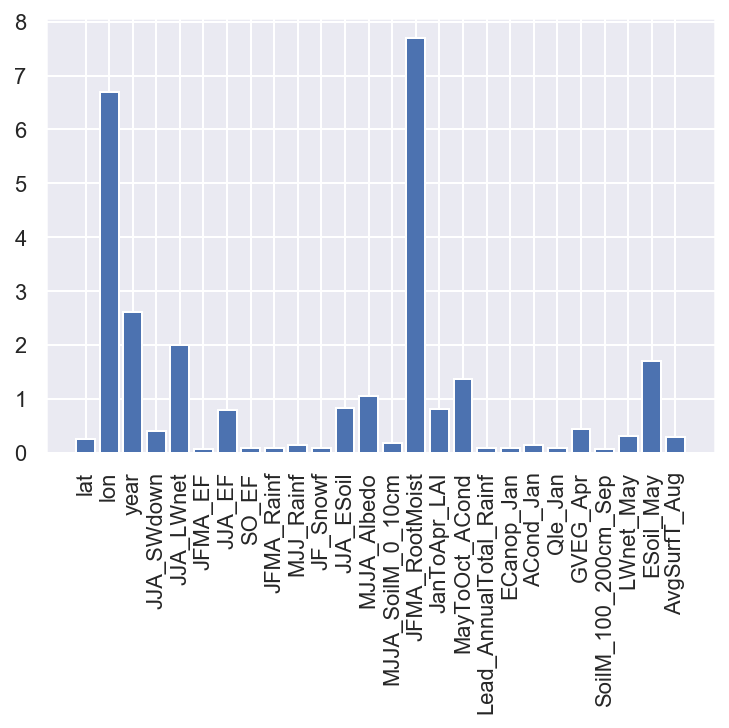

,0
lat,0.248852
lon,6.691449
year,2.605539
JJA_SWdown,0.391898
JJA_LWnet,2.003568
JFMA_EF,0.066716
JJA_EF,0.789790
SO_EF,0.074932
JFMA_Rainf,0.080703
MJJ_Rainf,0.132311


In [98]:
xgb_feature_importance = xgb_randomcv_retrain.named_steps['xgbR'].get_booster().get_score(importance_type='gain')
xgb_feature_names      = X_train_df.columns

df_xgb_importance = pd.DataFrame([*xgb_feature_importance.values()], index=np.array(xgb_feature_names))

sns.set(font_scale=1)
plt.bar(xgb_feature_names, [*xgb_feature_importance.values()])
plt.xticks(rotation = 90)
#plt.yticks(fontsize = 10)
plt.title('')
plt.show()
df_xgb_importance

## Visualize the prediction

In [99]:
df_test_pred = pd.DataFrame()
df_test_pred['lat'] = df_v2[df_v2['year'] == 2016]['lat']
df_test_pred['lon'] = df_v2[df_v2['year'] == 2016]['lon']
df_test_pred['yield'] = df_v2[df_v2['year'] == 2016]['yield']
df_test_pred['prediction'] = xgb_randomcv_y_pred.tolist()
df_test_pred['fractional_error'] = (df_test_pred['prediction'] - df_test_pred['yield'])/df_test_pred['yield']

In [100]:
df_test_pred.reset_index(drop=True)

,lat,lon,yield,prediction,fractional_error
0,25.25,252.25,0.868872,1.824384,1.099715
1,25.25,261.25,0.798186,1.167155,0.462259
2,25.25,261.75,1.102205,0.918236,-0.166911
3,25.75,251.75,0.442400,0.643519,0.454609
4,25.75,252.25,1.575155,2.109127,0.338996
...,...,...,...,...,...
1414,48.75,264.75,3.735792,3.760360,0.006576
1415,48.75,287.25,2.936604,3.165214,0.077848
1416,48.75,287.75,2.824051,3.106108,0.099877
1417,48.75,288.25,2.862302,3.007829,0.050843


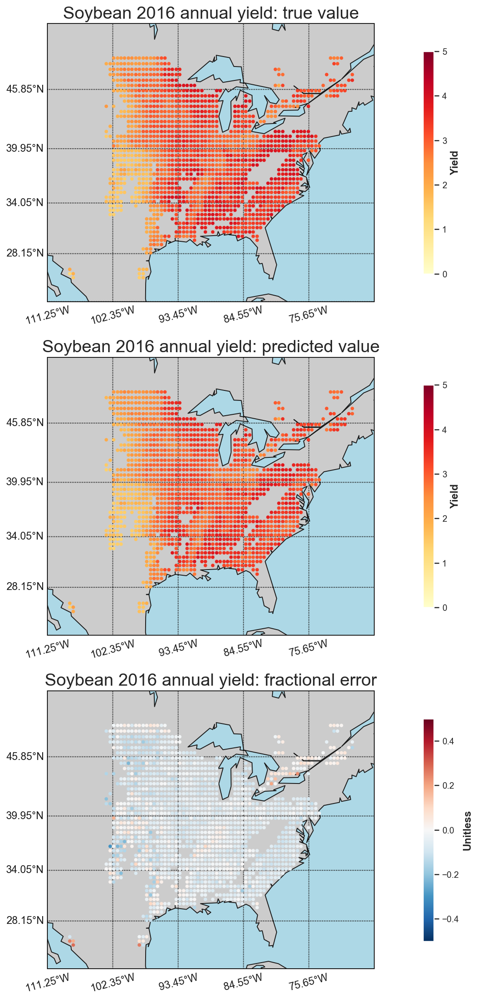

In [101]:
fig, axes        = plt.subplots(3, figsize = (20, 20))
test_pred_error  = ['yield', 'prediction', 'fractional_error']
plot_title       = ['true value', 'predicted value', 'fractional error']
cbar_labels      = ['Yield', 'Yield', 'Unitless']
#plt.tick_params(axis='both', which='major', labelsize=2)
sns.set(font_scale=1)

# **********************************
# Loop through plot_title
# **********************************
for column, title, cbar_label in zip(test_pred_error, plot_title, cbar_labels):
    
    xxxx = df_test_pred[['lat', 'lon', column]]
    
    col_index = test_pred_error.index(column)
                
    # How much to zoom from coordinates (in degrees)
    zoom_scale = 3

    # Setup the bounding box for the zoom and bounds of the map
    lats = xxxx['lat'].values
    lons = xxxx['lon'].values
    value= xxxx[column].values

    bbox = [np.min(lats)-zoom_scale,np.max(lats)+zoom_scale,\
            np.min(lons)-zoom_scale,np.max(lons)+zoom_scale]


    # Define the projection, scale, the corners of the map, and the resolution.
    m = Basemap(projection='merc',llcrnrlat=bbox[0],urcrnrlat=bbox[1],\
            llcrnrlon=bbox[2],urcrnrlon=bbox[3],lat_ts=10,resolution='c', ax=axes[col_index])

    # Draw coastlines and fill continents and water with color
    m.drawcoastlines()
    m.fillcontinents(color='#CCCCCC',lake_color='lightblue')

    # draw parallels, meridians, and color boundaries
    m.drawparallels(np.arange(bbox[0],bbox[1],(bbox[1]-bbox[0])/5),labels=[1,0,0,0])
    m.drawmeridians(np.arange(bbox[2],bbox[3],(bbox[3]-bbox[2])/5),labels=[0,0,0,1],rotation=15)
    m.drawmapboundary(fill_color='lightblue')
    
    # format colors for annual yield range
    if col_index < 2:
        alt_min  = 0
        alt_max  = 5
        colormap = 'YlOrRd'
    else:
        alt_min  = -0.5
        alt_max  = 0.5
        colormap = 'RdBu_r'
    
    #cmap = plt.get_cmap('gist_earth')
    cmap = plt.get_cmap(colormap)
    normalize = matplotlib.colors.Normalize(vmin=alt_min, vmax=alt_max)

    # plot yield with different colors using the numpy interpolation mapping tool
    # the range [50,200] can be changed to create different colors and ranges
    
    for ii in range(0,len(value)):
        x,y = m(lons[ii],lats[ii])
        if pd.notna(value[ii]):
            color_interp = np.interp(value[ii],[alt_min,alt_max],[50,200])
            axes[col_index].plot(x,y,marker='o',markersize=3,color=cmap(int(color_interp)))

    # format the colorbar 
    cax, _ = matplotlib.colorbar.make_axes(axes[col_index], shrink=0.8, extend="max")
    cbar = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap, norm=normalize, label=cbar_label)
    cbar.ax.tick_params(labelsize=10) 
    #cbar.ax.set_label('Annual yield')
    cbar.set_label(label=cbar_label, size='medium', weight='bold')

    axes[col_index].set_title('Soybean 2016 annual yield: ' + title,fontsize=20)